# Housing Prediction

## Data Preperation

In [1]:
#Import Dependenacies
import numpy as np
import pandas as pd
import math
import statistics
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.datasets import load_boston
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingRegressor
import joblib

C:\Users\aberg\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
#Loading dataset Ames Housing
ames_df = pd.read_csv('AmesHousing.csv')

In [3]:
#Setting display options for dataframe
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [4]:
#Loading dataframe
ames_df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,TA,TA,CBlock,TA,Gd,Gd,BLQ,639.0,Unf,0.0,441.0,1080.0,GasA,Fa,Y,SBrkr,1656,0,0,1656,1.0,0.0,1,0,3,1,TA,7,Typ,2,Gd,Attchd,1960.0,Fin,2.0,528.0,TA,TA,P,210,62,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,7,5,1968,1968,Hip,CompShg,BrkFace,BrkFace,None,0.0,Gd,TA,CBlock,TA,TA,No,ALQ,1065.0,Unf,0.0,1045.0,2110.0,GasA,Ex,Y,SBrkr,2110,0,0,2110,1.0,0.0,2,1,3,1,Ex,8,Typ,2,TA,Attchd,1968.0,Fin,2.0,522.0,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900
5,6,527105030,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal,195500
6,7,527127150,120,RL,41.0,4920,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,2001,2001,Gable,CompShg,CemntBd,CmentBd,None,0.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,616.0,Unf,0.0,722.0,1338.0,GasA,Ex,Y,SBrkr,1338,0,0,1338,1.0,0.0,2,0,2,1,Gd,6,Typ,0,NaN,Attchd,2001.0,Fin,2.0,582.0,TA,TA,Y,0,0,170,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,213500
7,8,527145080,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal,191500
8,9,527146030,120,RL,39.0,5389,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1995,1996,Gable,CompShg,CemntBd,CmentBd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,1180.0,Unf,0.0,415.0,1595.0,GasA,Ex,Y,SBrkr,1616,0,0,1

In [5]:
#Looking at the amount of entries in the dataset
print("There are % s entries in this data set" %len(ames_df))

There are 2930 entries in this data set


In [6]:
#Printing the column names of the dataset
print(ames_df.columns.tolist())

['Order', 'PID', 'MS SubClass', 'MS Zoning', 'Lot Frontage', 'Lot Area', 'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Overall Qual', 'Overall Cond', 'Year Built', 'Year Remod/Add', 'Roof Style', 'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Mas Vnr Area', 'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1', 'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', 'Heating', 'Heating QC', 'Central Air', 'Electrical', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'Kitchen Qual', 'TotRms AbvGrd', 'Functional', 'Fireplaces', 'Fireplace Qu', 'Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Cars', 'Garage Area', 'Garage Qual', 'Garage Cond', 'Paved Drive', 'Wood Deck 

In [7]:
#Making a list of numerical feature names that I would like to keep in the model 
ames_features = ['Lot Config', 'Neighborhood', 'Bldg Type', 'House Style', 
                 'Overall Qual', 'Overall Cond', 'Foundation', 'Central Air', 'Full Bath', 'Half Bath',
                'Bedroom AbvGr', 'Garage Cars']

In [8]:
#Printing out the unique values for each feature from ames_features
for feature in ames_features:
    print("Feature", feature, "has % s" %ames_df[feature].unique())

Feature Lot Config has ['Corner' 'Inside' 'CulDSac' 'FR2' 'FR3']
Feature Neighborhood has ['NAmes' 'Gilbert' 'StoneBr' 'NWAmes' 'Somerst' 'BrDale' 'NPkVill'
 'NridgHt' 'Blmngtn' 'NoRidge' 'SawyerW' 'Sawyer' 'Greens' 'BrkSide'
 'OldTown' 'IDOTRR' 'ClearCr' 'SWISU' 'Edwards' 'CollgCr' 'Crawfor'
 'Blueste' 'Mitchel' 'Timber' 'MeadowV' 'Veenker' 'GrnHill' 'Landmrk']
Feature Bldg Type has ['1Fam' 'TwnhsE' 'Twnhs' 'Duplex' '2fmCon']
Feature House Style has ['1Story' '2Story' '1.5Fin' 'SFoyer' 'SLvl' '2.5Unf' '1.5Unf' '2.5Fin']
Feature Overall Qual has [ 6  5  7  8  9  4  3  2 10  1]
Feature Overall Cond has [5 6 7 2 8 4 9 3 1]
Feature Foundation has ['CBlock' 'PConc' 'Wood' 'BrkTil' 'Slab' 'Stone']
Feature Central Air has ['Y' 'N']
Feature Full Bath has [1 2 3 0 4]
Feature Half Bath has [0 1 2]
Feature Bedroom AbvGr has [3 2 1 4 6 5 0 8]
Feature Garage Cars has [ 2.  1.  3.  0.  4.  5. nan]


In [9]:
#Making a list of the features I would like to drop from the dataset
ames_feature_drop = ['MS SubClass', 'MS Zoning','Order', 'PID', 'Street', 'Alley', 
                     'Lot Shape', 'Land Contour', 'Utilities', 'Land Slope', 'Condition 1', 'Condition 2', 'Year Remod/Add', 'Roof Style', 
                     'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 
                     'Mas Vnr Area', 'Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 
                     'BsmtFin Type 1', 'BsmtFin Type 2', 'BsmtFin SF 2', 'Heating', 'Heating QC', 'Electrical',
                     '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Bsmt Full Bath', 'Bsmt Half Bath', 
                     'Kitchen AbvGr', 'Kitchen Qual', 'TotRms AbvGrd', 'Functional', 'Fireplaces', 'Fireplace Qu', 
                     'Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Area', 'Garage Qual', 
                     'Garage Cond', 'Paved Drive', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 
                     'Screen Porch', 'Pool Area', 'Pool QC', 'Fence', 'Misc Feature', 'Misc Val', 'Mo Sold', 'Yr Sold', 
                     'Sale Type', 'Sale Condition']

In [10]:
#Dropping the features from the dataset
for i in ames_feature_drop:
    ames_df = ames_df.drop(i, axis=1)

In [11]:
#Taking a look at the dataset
ames_df.head()

,Lot Frontage,Lot Area,Lot Config,Neighborhood,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Foundation,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Central Air,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Garage Cars,SalePrice
0,141.0,31770,Corner,NAmes,1Fam,1Story,6,5,1960,CBlock,639.0,441.0,1080.0,Y,1656,1,0,3,2.0,215000
1,80.0,11622,Inside,NAmes,1Fam,1Story,5,6,1961,CBlock,468.0,270.0,882.0,Y,896,1,0,2,1.0,105000
2,81.0,14267,Corner,NAmes,1Fam,1Story,6,6,1958,CBlock,923.0,406.0,1329.0,Y,1329,1,1,3,1.0,172000
3,93.0,11160,Corner,NAmes,1Fam,1Story,7,5,1968,CBlock,1065.0,1045.0,2110.0,Y,2110,2,1,3,2.0,244000
4,74.0,13830,Inside,Gilbert,1Fam,2Story,5,5,1997,PConc,791.0,137.0,928.0,Y,1629,2,1,3,2.0,189900


In [12]:
#Displaying basic statisics about each numerical feature
display(ames_df.describe())

,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Garage Cars,SalePrice
count,2440.000000,2930.000000,2930.000000,2930.000000,2930.000000,2929.000000,2929.000000,2929.000000,2930.000000,2930.000000,2930.000000,2930.000000,2929.000000,2930.000000
mean,69.224590,10147.921843,6.094881,5.563140,1971.356314,442.629566,559.262547,1051.614544,1499.690444,1.566553,0.379522,2.854266,1.766815,180796.060068
std,23.365335,7880.017759,1.411026,1.111537,30.245361,455.590839,439.494153,440.615067,505.508887,0.552941,0.502629,0.827731,0.760566,79886.692357
min,21.000000,1300.000000,1.000000,1.000000,1872.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,12789.000000
25%,58.000000,7440.250000,5.000000,5.000000,1954.000000,0.000000,219.000000,793.000000,1126.000000,1.000000,0.000000,2.000000,1.000000,129500.000000
50%,68.000000,9436.500000,6.000000,5.000000,1973.000000,370.000000,466.000000,990.000000,1442.000000,2.000000,0.000000,3.000000,2.000000,160000.000000
75%,80.000000,11555.250000,7.000000,6.000000,2001.000000,734.000000,802.000000,1302.000000,1742.750000,2.000000,1.000000,3.000000,2.000000,213500.000000
max,313.000000,215245.000000,10.000000,9.000000,2010.000000,5644.000000,2336.000000,6110.000000,5642.000000,4.000000,2.000000,8.000000,5.000000,755000.000000


## Clean and Process Data

In [13]:
#Printing out the sum or NaN values in each feature
ames_df.isnull().sum()

Lot Frontage     490
Lot Area           0
Lot Config         0
Neighborhood       0
Bldg Type          0
House Style        0
Overall Qual       0
Overall Cond       0
Year Built         0
Foundation         0
BsmtFin SF 1       1
Bsmt Unf SF        1
Total Bsmt SF      1
Central Air        0
Gr Liv Area        0
Full Bath          0
Half Bath          0
Bedroom AbvGr      0
Garage Cars        1
SalePrice          0
dtype: int64

In [14]:
ames_df.shape

(2930, 20)

In [15]:
#Dropping NaN values
ames_df = ames_df.dropna()

In [16]:
#Confirming NaN values were dropped
ames_df.isnull().sum()

Lot Frontage     0
Lot Area         0
Lot Config       0
Neighborhood     0
Bldg Type        0
House Style      0
Overall Qual     0
Overall Cond     0
Year Built       0
Foundation       0
BsmtFin SF 1     0
Bsmt Unf SF      0
Total Bsmt SF    0
Central Air      0
Gr Liv Area      0
Full Bath        0
Half Bath        0
Bedroom AbvGr    0
Garage Cars      0
SalePrice        0
dtype: int64

In [17]:
ames_df.shape

(2438, 20)

In [18]:
#Making a list of numerical features in the dataset
ames_df_num = ames_df[['Lot Frontage', 'Lot Area', 'Year Built', 'BsmtFin SF 1', 
                       'Bsmt Unf SF', 'Total Bsmt SF', 'Gr Liv Area', 'SalePrice']]

In [19]:
#Making a list of catigorical features in the dataset
ames_df_cat = ames_df[['Lot Config', 'Neighborhood', 'Bldg Type', 'House Style', 'Overall Qual', 'Overall Cond', 
                       'Foundation', 'Central Air', 'Full Bath', 
                       'Half Bath', 'Bedroom AbvGr', 'Garage Cars']]

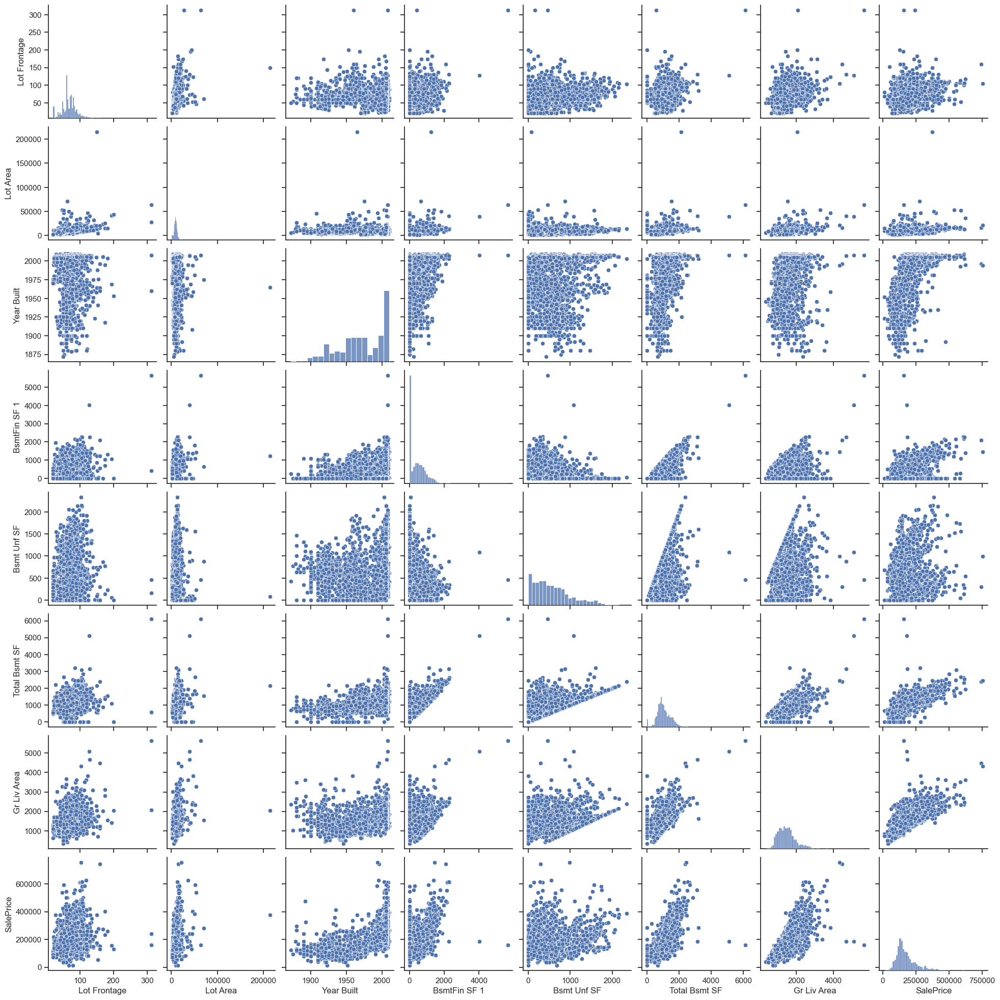

In [20]:
sns.set_theme(style="ticks")

sns.pairplot(ames_df_num)

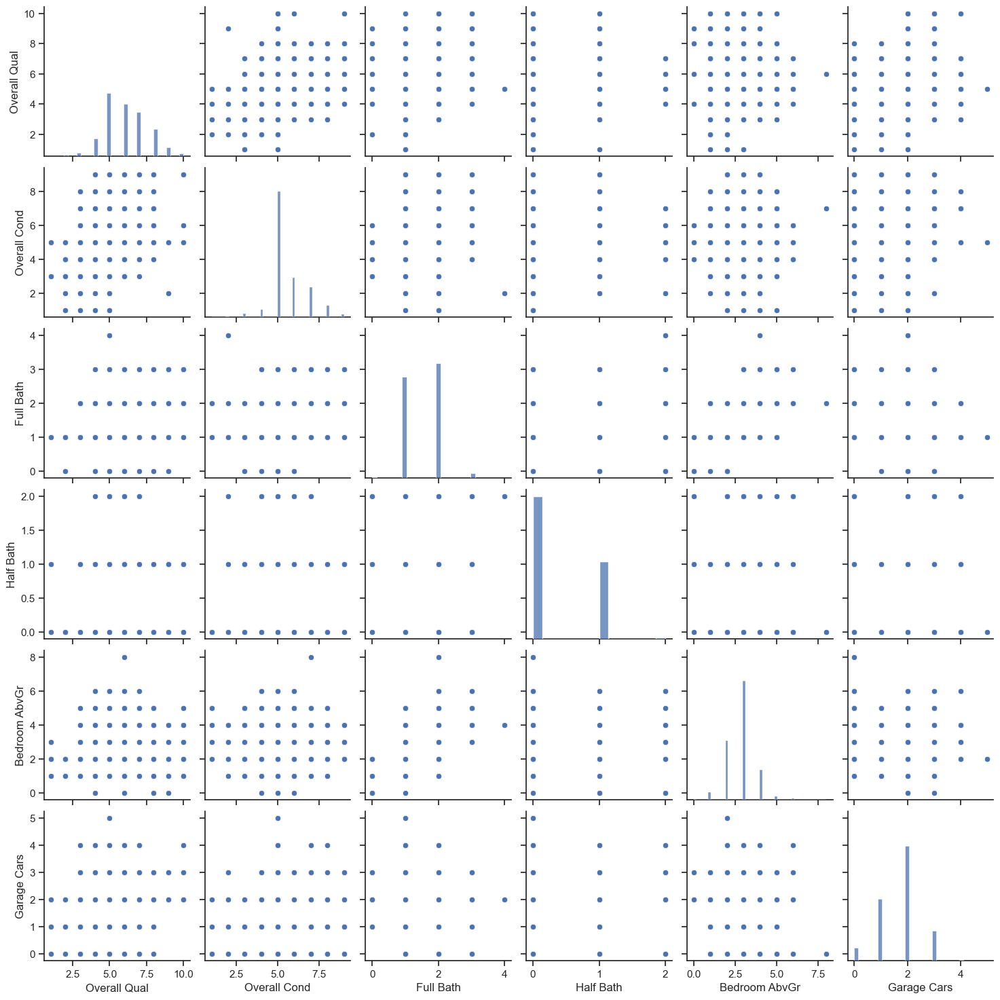

In [21]:
sns.set_theme(style="ticks")

sns.pairplot(ames_df_cat)

<AxesSubplot:xlabel='SalePrice'>

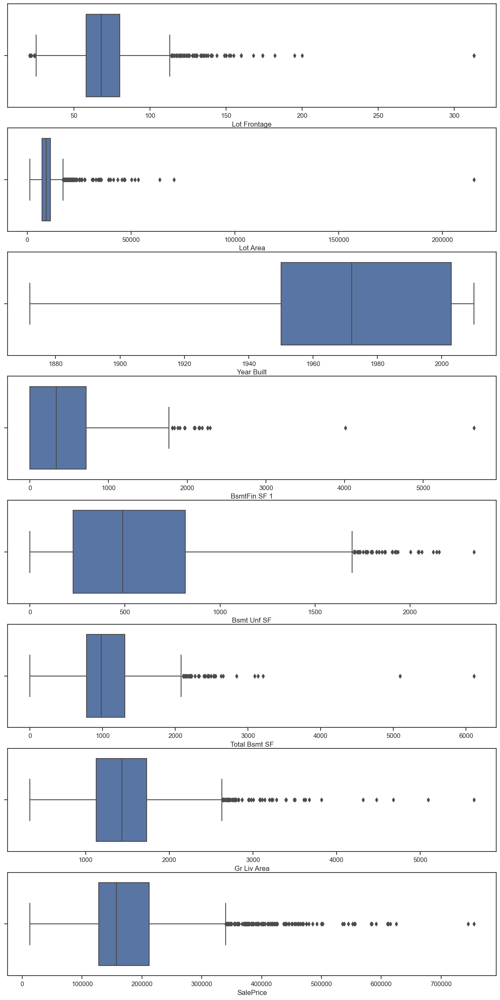

In [22]:
fig, axs = plt.subplots(nrows=8)
fig.set_size_inches(15, 30)
sns.boxplot(x='Lot Frontage', data=ames_df, ax=axs[0])
sns.boxplot(x='Lot Area', data=ames_df, ax=axs[1])
sns.boxplot(x='Year Built', data=ames_df, ax=axs[2])
sns.boxplot(x='BsmtFin SF 1', data=ames_df, ax=axs[3])
sns.boxplot(x='Bsmt Unf SF', data=ames_df, ax=axs[4])
sns.boxplot(x='Total Bsmt SF', data=ames_df, ax=axs[5])
sns.boxplot(x='Gr Liv Area', data=ames_df, ax=axs[6])
sns.boxplot(x='SalePrice', data=ames_df, ax=axs[7])

In [23]:
for i in ames_df_num:
    print(i, ames_df[i].mean())

Lot Frontage 69.2202625102543
Lot Area 9711.335520918787
Year Built 1970.5512715340442
BsmtFin SF 1 426.7481542247744
Bsmt Unf SF 577.5783429040197
Total Bsmt SF 1051.0512715340442
Gr Liv Area 1489.0873666940115
SalePrice 180153.18334700575


In [24]:
def get_outliers_IQR(df):
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    IQR = q3-q1
    outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
    outliers = outliers.dropna(how='all')
    return outliers

In [25]:
IQR_col = ['Lot Frontage', 'Lot Area', 'Year Built', 'BsmtFin SF 1', 
                     'Bsmt Unf SF', 'Total Bsmt SF', 'Gr Liv Area', 'SalePrice']
for column in IQR_col:
    print("IQR for", column, ": ", np.quantile(ames_df[column], [0,0.25,0.5,0.75,1]))

IQR for Lot Frontage :  [ 21.  58.  68.  80. 313.]
IQR for Lot Area :  [  1300.     7226.25   9252.    11209.25 215245.  ]
IQR for Year Built :  [1872. 1950. 1972. 2003. 2010.]
IQR for BsmtFin SF 1 :  [   0.      0.    338.    716.75 5644.  ]
IQR for Bsmt Unf SF :  [   0.    228.25  489.    818.   2336.  ]
IQR for Total Bsmt SF :  [   0.   780.   983.5 1307.5 6110. ]
IQR for Gr Liv Area :  [ 334.   1124.25 1433.5  1727.5  5642.  ]
IQR for SalePrice :  [ 12789. 127500. 157500. 212450. 755000.]


In [26]:
outliers = get_outliers_IQR(ames_df_num)
print("Numer of outliers:"+ str(len(outliers)))
print("Max outlier: n/"+ str(outliers.max()))
print("Min outlier: n/"+ str(outliers.min()))
outliers

Numer of outliers:398
Max outlier: n/Lot Frontage        313.0
Lot Area         215245.0
Year Built            NaN
BsmtFin SF 1       5644.0
Bsmt Unf SF        2336.0
Total Bsmt SF      6110.0
Gr Liv Area        5642.0
SalePrice        755000.0
dtype: float64
Min outlier: n/Lot Frontage         21.0
Lot Area          17217.0
Year Built            NaN
BsmtFin SF 1       1810.0
Bsmt Unf SF        1704.0
Total Bsmt SF      2108.0
Gr Liv Area        2634.0
SalePrice        340000.0
dtype: float64


,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,SalePrice
0,141.0,31770.0,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,2110.0,NaN,NaN
15,NaN,53504.0,NaN,NaN,NaN,NaN,3279.0,538000.0
16,152.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,394432.0
18,140.0,19138.0,NaN,NaN,NaN,NaN,NaN,NaN
29,21.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30,21.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,21.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
outliers.shape

(398, 8)

In [28]:
ames_df.shape

(2438, 20)

In [29]:
ames_num_columns = ['Lot Frontage', 'Lot Area', 'Year Built', 'BsmtFin SF 1', 
                     'Bsmt Unf SF', 'Total Bsmt SF', 'Gr Liv Area', 'SalePrice']

In [30]:
def remove_outliers(df1, df2, columns):
    for i in columns:
        filter_values = df2[i].values.tolist()
        filter = df1[i].isin(filter_values)
        df1 = df1.drop(df1[filter].index)
        return df1

In [31]:
ames_df = remove_outliers(ames_df, outliers, ames_num_columns)

In [32]:
ames_df.head()

,Lot Frontage,Lot Area,Lot Config,Neighborhood,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Foundation,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Central Air,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Garage Cars,SalePrice
1,80.0,11622,Inside,NAmes,1Fam,1Story,5,6,1961,CBlock,468.0,270.0,882.0,Y,896,1,0,2,1.0,105000
2,81.0,14267,Corner,NAmes,1Fam,1Story,6,6,1958,CBlock,923.0,406.0,1329.0,Y,1329,1,1,3,1.0,172000
3,93.0,11160,Corner,NAmes,1Fam,1Story,7,5,1968,CBlock,1065.0,1045.0,2110.0,Y,2110,2,1,3,2.0,244000
4,74.0,13830,Inside,Gilbert,1Fam,2Story,5,5,1997,PConc,791.0,137.0,928.0,Y,1629,2,1,3,2.0,189900
5,78.0,9978,Inside,Gilbert,1Fam,2Story,6,6,1998,PConc,602.0,324.0,926.0,Y,1604,2,1,3,2.0,195500


In [33]:
ames_df_num.head()

,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,SalePrice
0,141.0,31770,1960,639.0,441.0,1080.0,1656,215000
1,80.0,11622,1961,468.0,270.0,882.0,896,105000
2,81.0,14267,1958,923.0,406.0,1329.0,1329,172000
3,93.0,11160,1968,1065.0,1045.0,2110.0,2110,244000
4,74.0,13830,1997,791.0,137.0,928.0,1629,189900


In [34]:
ames_df.shape

(2251, 20)

In [35]:
ames_df_num.isna().sum()

Lot Frontage     0
Lot Area         0
Year Built       0
BsmtFin SF 1     0
Bsmt Unf SF      0
Total Bsmt SF    0
Gr Liv Area      0
SalePrice        0
dtype: int64

In [36]:
display(ames_df.describe())

,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Garage Cars,SalePrice
count,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000,2251.000000
mean,68.709462,9640.876944,6.095957,5.579742,1970.048423,423.209685,588.403821,1056.924478,1485.663705,1.559751,0.343403,2.850289,1.750777,180980.808085
std,16.712577,4142.871066,1.440258,1.110042,32.143067,445.502452,446.580574,423.969114,481.636243,0.545981,0.491505,0.823150,0.779512,82025.048191
min,25.000000,2268.000000,1.000000,1.000000,1872.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,12789.000000
25%,60.000000,7500.000000,5.000000,5.000000,1949.500000,0.000000,240.000000,796.000000,1131.000000,1.000000,0.000000,2.000000,1.000000,128500.000000
50%,68.000000,9300.000000,6.000000,5.000000,1972.000000,338.000000,501.000000,994.000000,1436.000000,2.000000,0.000000,3.000000,2.000000,159000.000000
75%,80.000000,11069.500000,7.000000,6.000000,2003.000000,728.000000,833.500000,1311.500000,1728.000000,2.000000,1.000000,3.000000,2.000000,213000.000000
max,113.000000,70761.000000,10.000000,9.000000,2010.000000,2288.000000,2336.000000,3206.000000,4316.000000,4.000000,2.000000,8.000000,5.000000,755000.000000


## Analyze

<AxesSubplot:xlabel='SalePrice'>

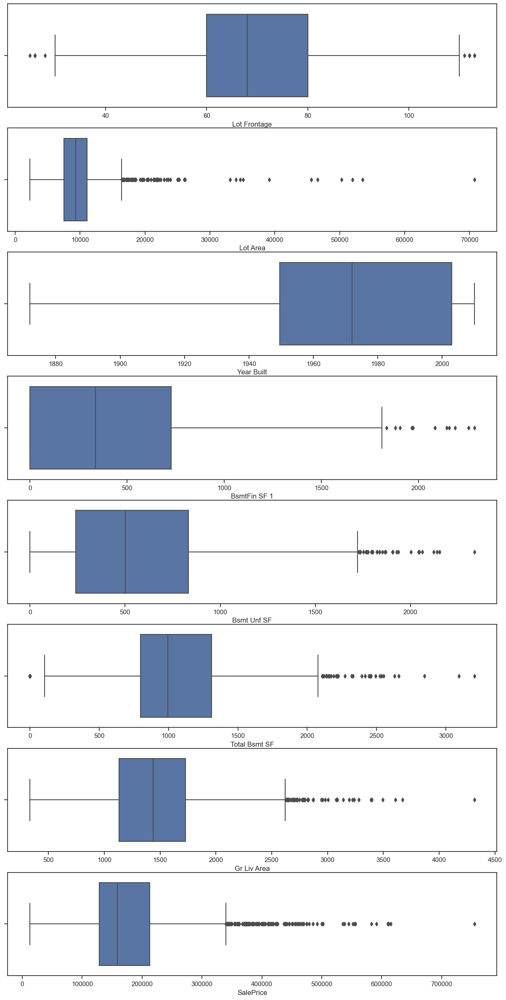

In [37]:
fig, axs = plt.subplots(nrows=8)
fig.set_size_inches(15, 30)
sns.boxplot(x='Lot Frontage', data=ames_df, ax=axs[0])
sns.boxplot(x='Lot Area', data=ames_df, ax=axs[1])
sns.boxplot(x='Year Built', data=ames_df, ax=axs[2])
sns.boxplot(x='BsmtFin SF 1', data=ames_df, ax=axs[3])
sns.boxplot(x='Bsmt Unf SF', data=ames_df, ax=axs[4])
sns.boxplot(x='Total Bsmt SF', data=ames_df, ax=axs[5])
sns.boxplot(x='Gr Liv Area', data=ames_df, ax=axs[6])
sns.boxplot(x='SalePrice', data=ames_df, ax=axs[7])

<AxesSubplot:>

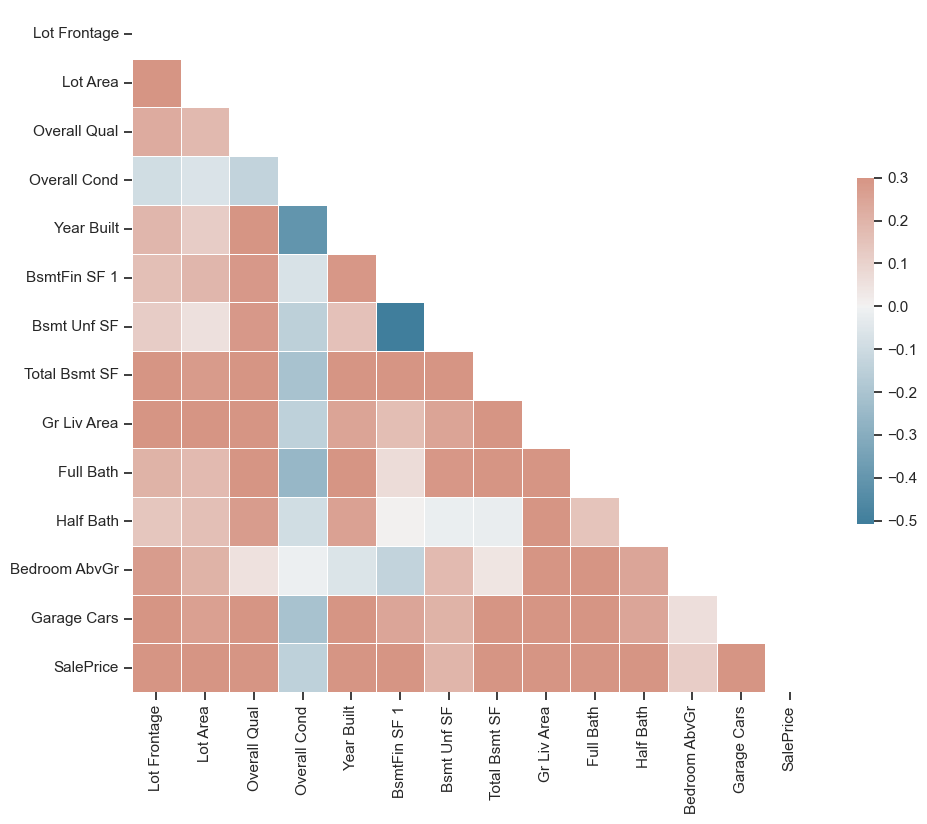

In [38]:
ames_df_corr = ames_df.corr()

mask = np.triu(np.ones_like(ames_df_corr, dtype=bool))

fig, ax = plt.subplots(figsize=(11,9))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(ames_df_corr, mask=mask, cmap=cmap, vmax=0.3, center=0,
           square=True, linewidths=0.5, cbar_kws={"shrink": 0.5})

### Catigorical Features

Text(0.5, 1.0, 'Count of Each Type of Lot Config')

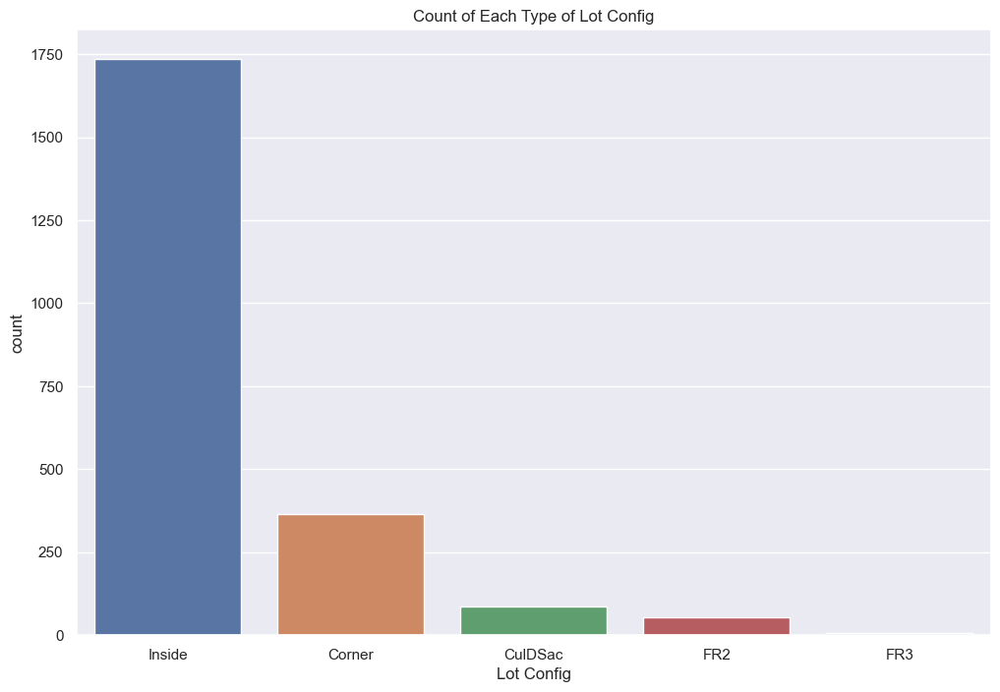

In [39]:
#Count plot showing the count of each type of lot config
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(12.0, 8.0)})

sns.countplot(x=ames_df["Lot Config"]).set_title('Count of Each Type of Lot Config')

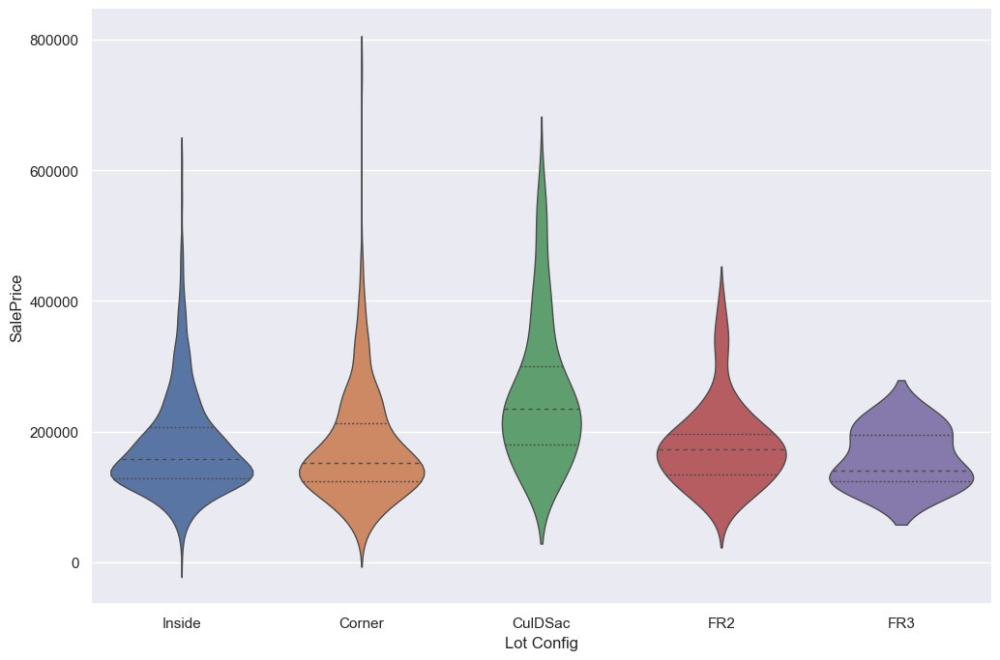

In [40]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(12.0, 8.0)})
sns.violinplot(data=ames_df, x="Lot Config", y="SalePrice",
               split=True, inner="quart", linewidth=1)
sns.despine(left=True)

Text(0.5, 1.0, 'Count of each Neighborhood')

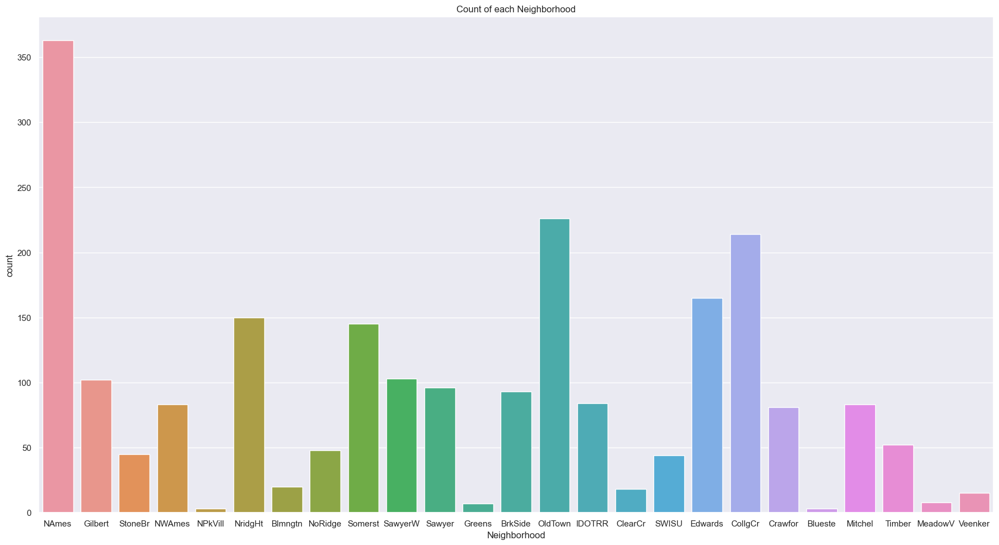

In [41]:
#
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(22.0,11.5)})

sns.countplot(x=ames_df["Neighborhood"]).set_title('Count of each Neighborhood')

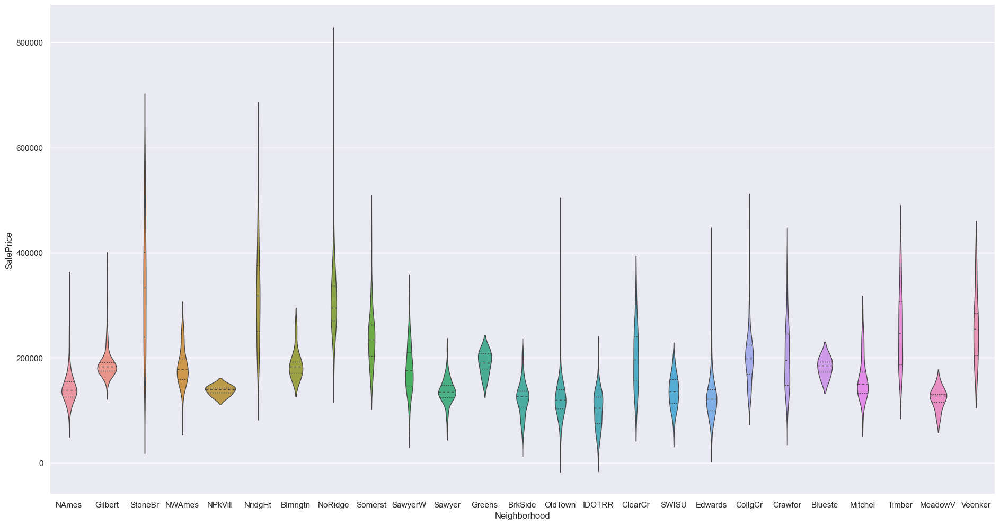

In [42]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="Neighborhood", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='Bldg Type', ylabel='count'>

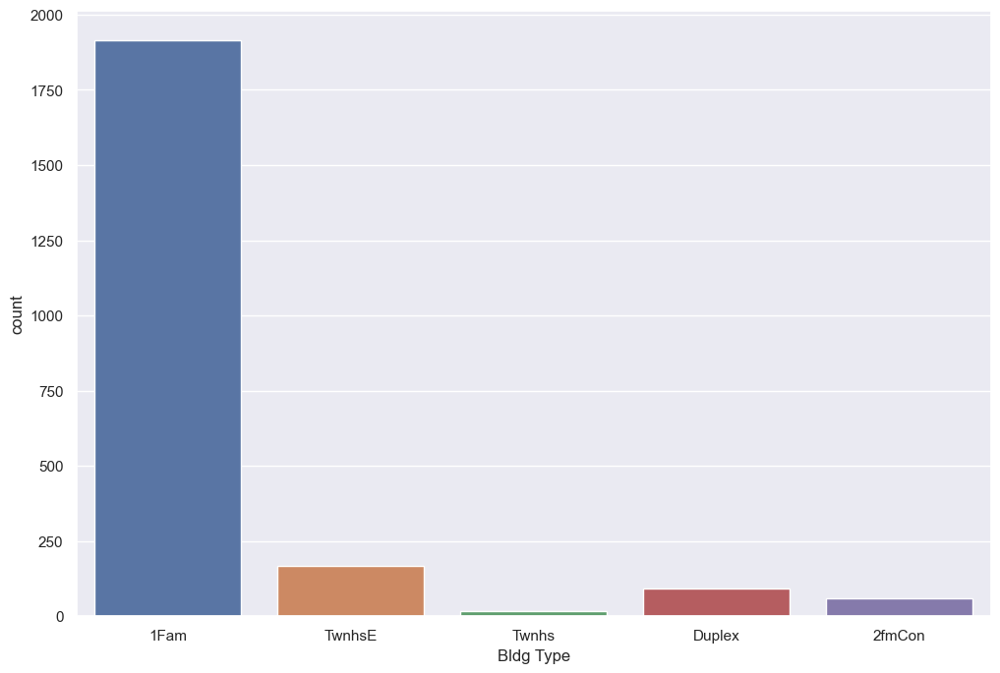

In [43]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(12.0, 8.0)})

sns.countplot(x=ames_df["Bldg Type"])

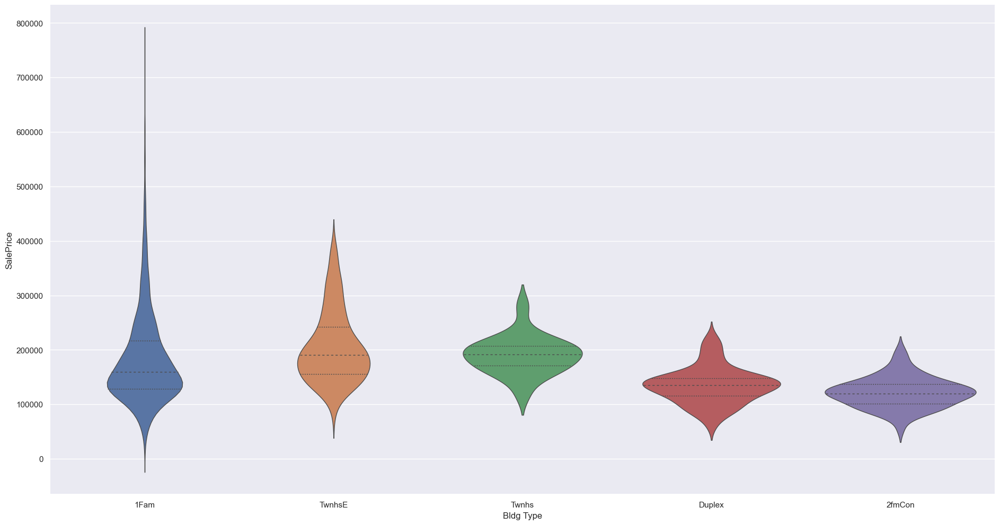

In [44]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="Bldg Type", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='House Style', ylabel='count'>

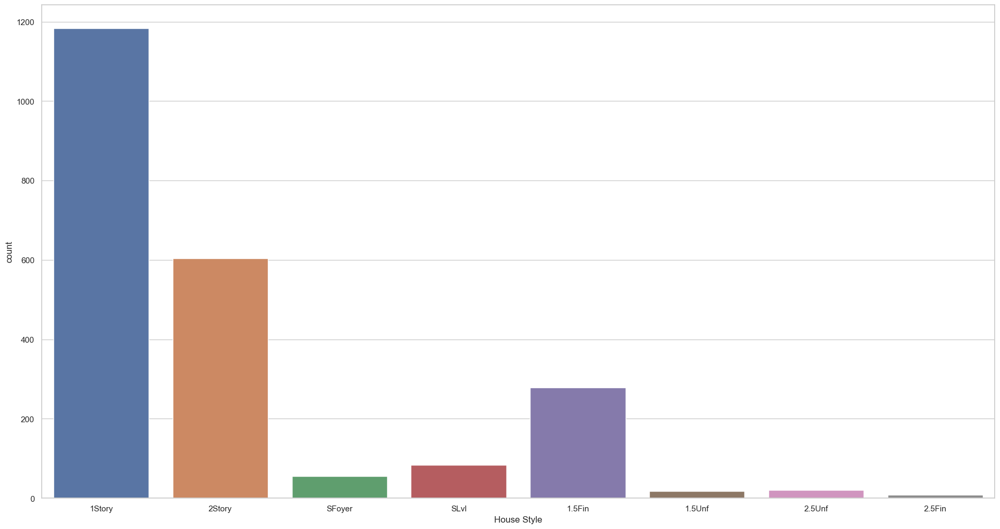

In [45]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["House Style"])

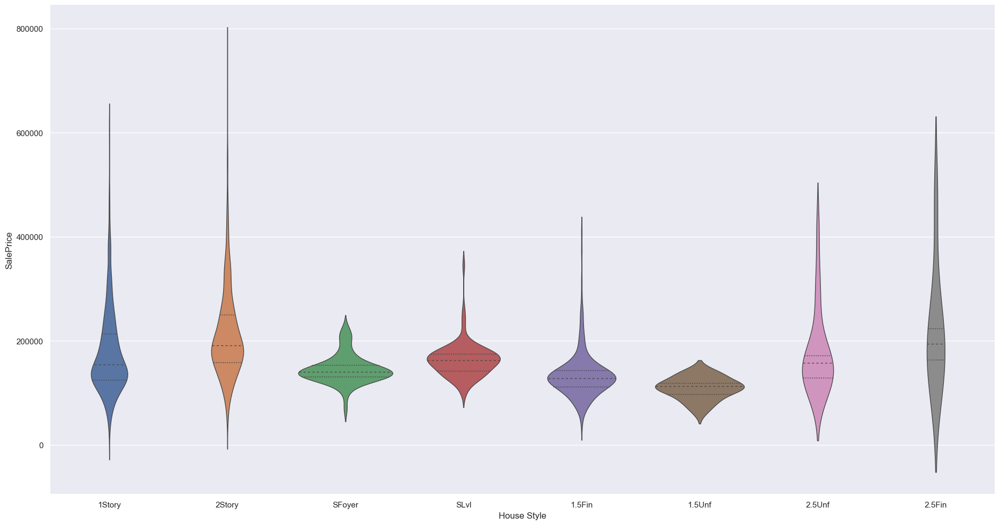

In [46]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="House Style", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='Overall Qual', ylabel='count'>

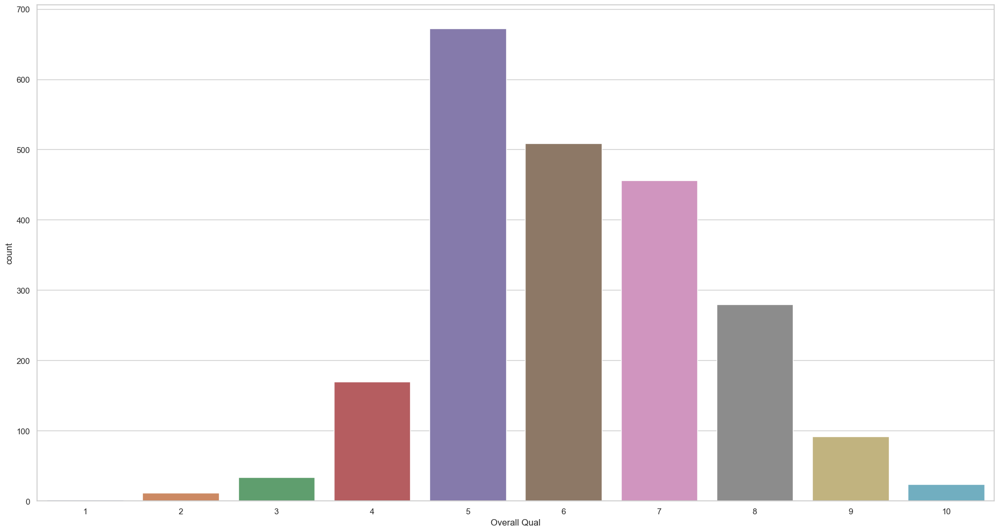

In [47]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Overall Qual"])

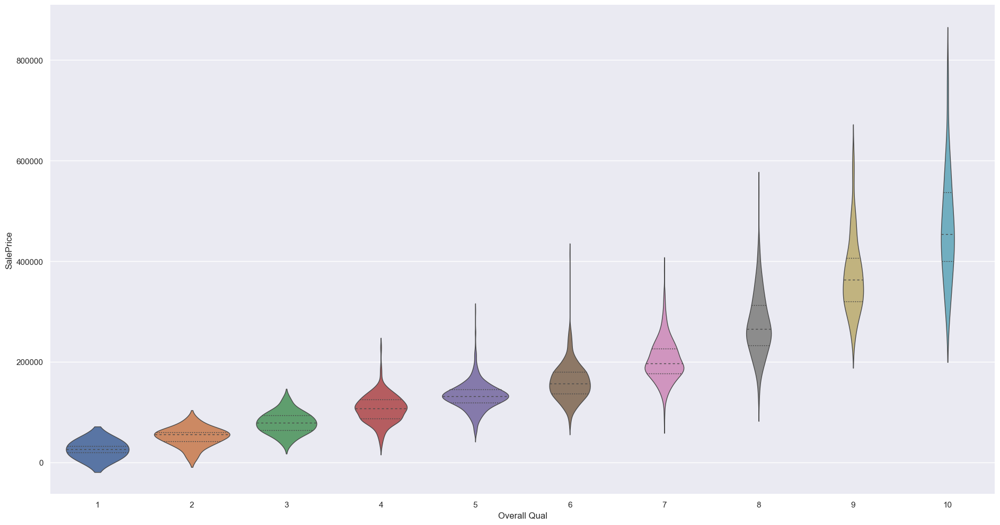

In [48]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="Overall Qual", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='Overall Qual', ylabel='SalePrice'>

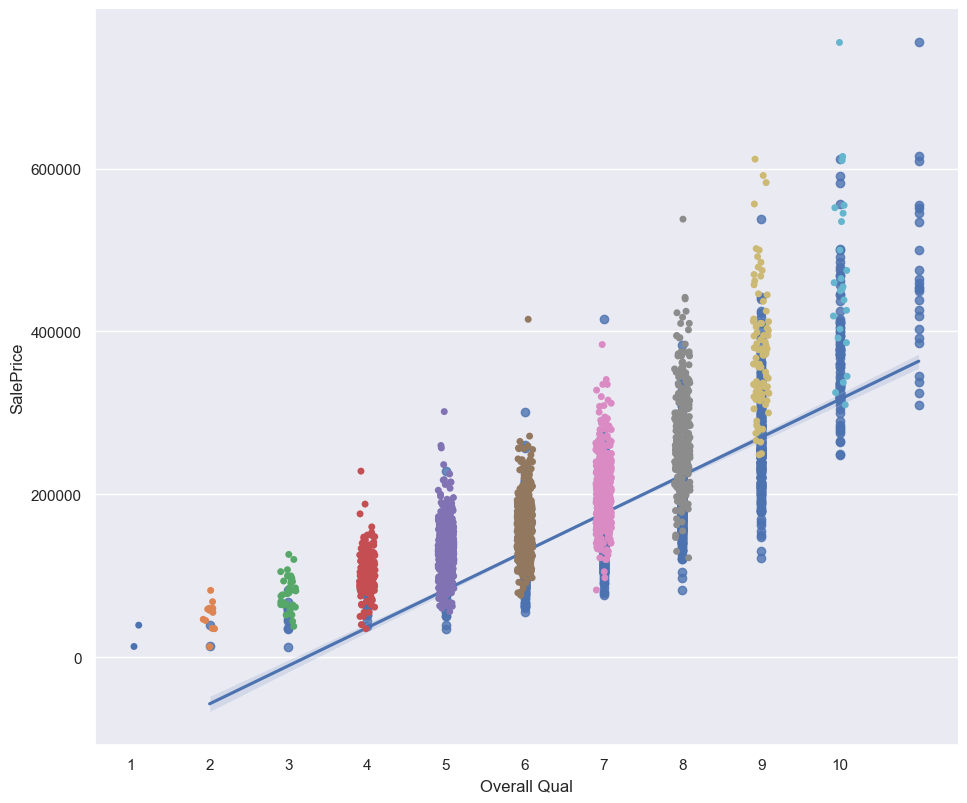

In [49]:
sns.set_theme()

sns.catplot(
    data=ames_df, x="Overall Qual", y="SalePrice", height=8.2, aspect=1.2
)
sns.regplot(
    data=ames_df, x="Overall Qual", y="SalePrice"
)

<AxesSubplot:xlabel='Overall Cond', ylabel='count'>

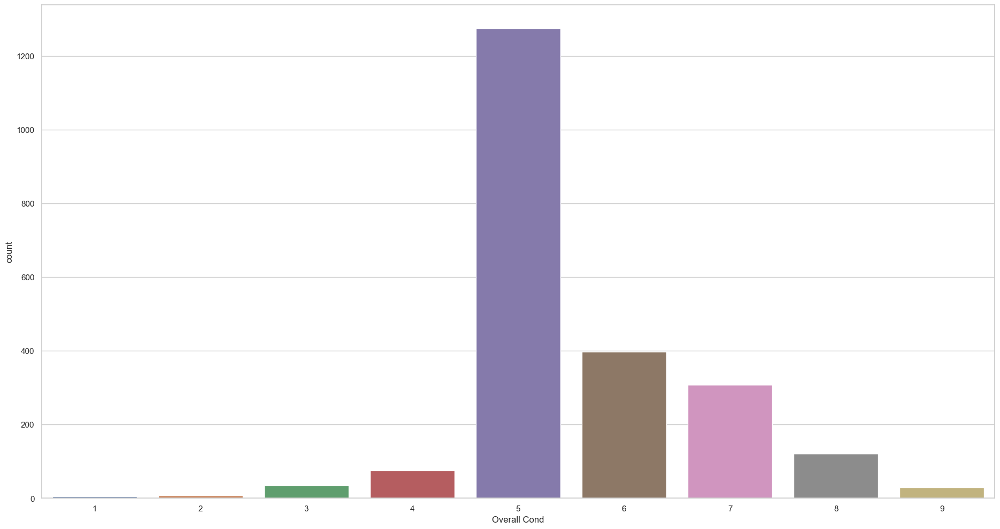

In [50]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Overall Cond"])

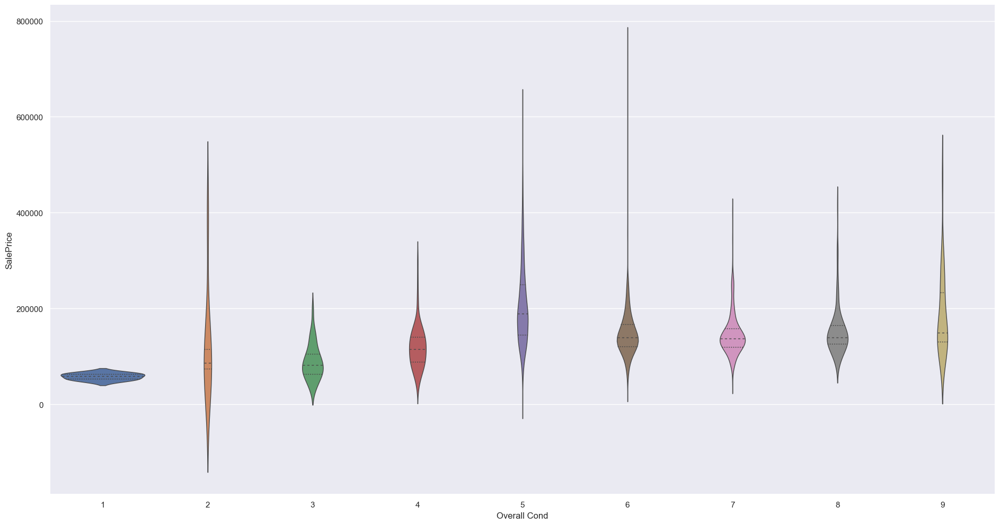

In [51]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="Overall Cond", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='Overall Cond', ylabel='SalePrice'>

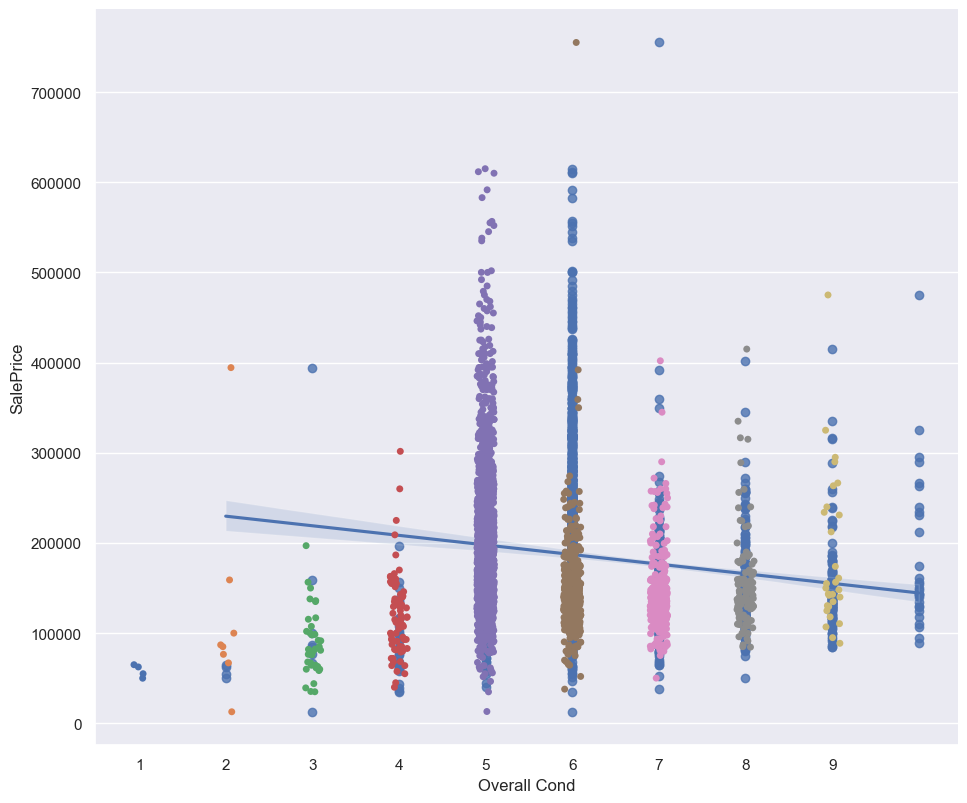

In [52]:
sns.set_theme()

sns.catplot(
    data=ames_df, x="Overall Cond", y="SalePrice", height=8.2, aspect=1.2
)
sns.regplot(
    data=ames_df, x="Overall Cond", y="SalePrice"
)

<AxesSubplot:xlabel='Foundation', ylabel='count'>

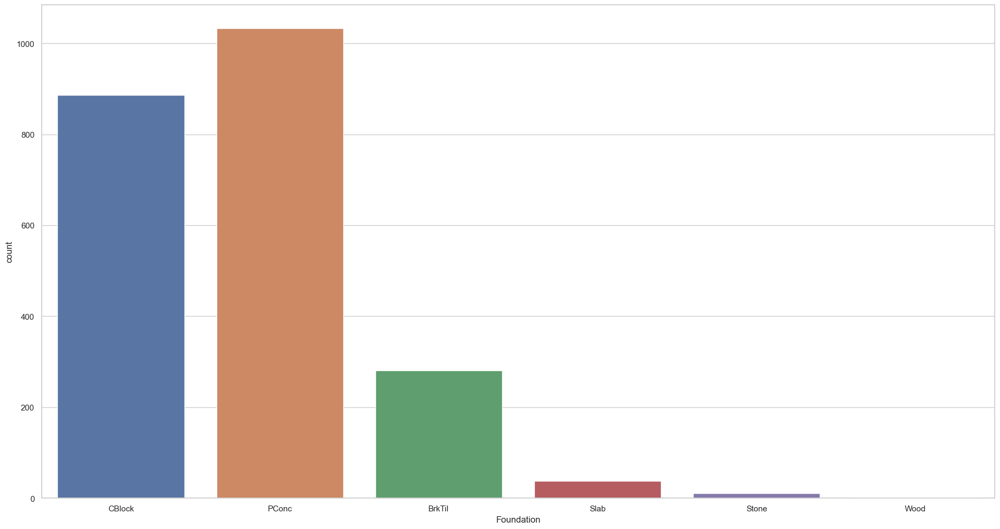

In [53]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Foundation"])

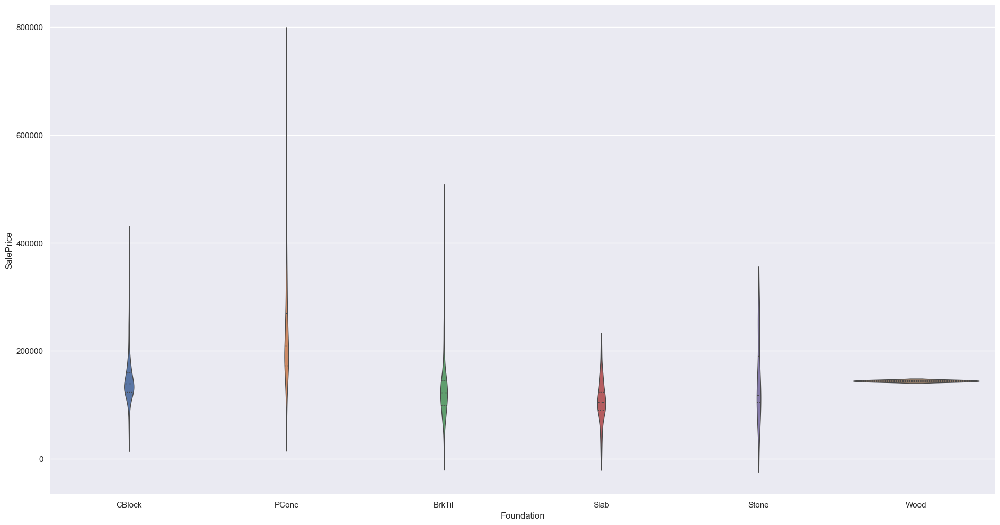

In [54]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="Foundation", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='Foundation', ylabel='SalePrice'>

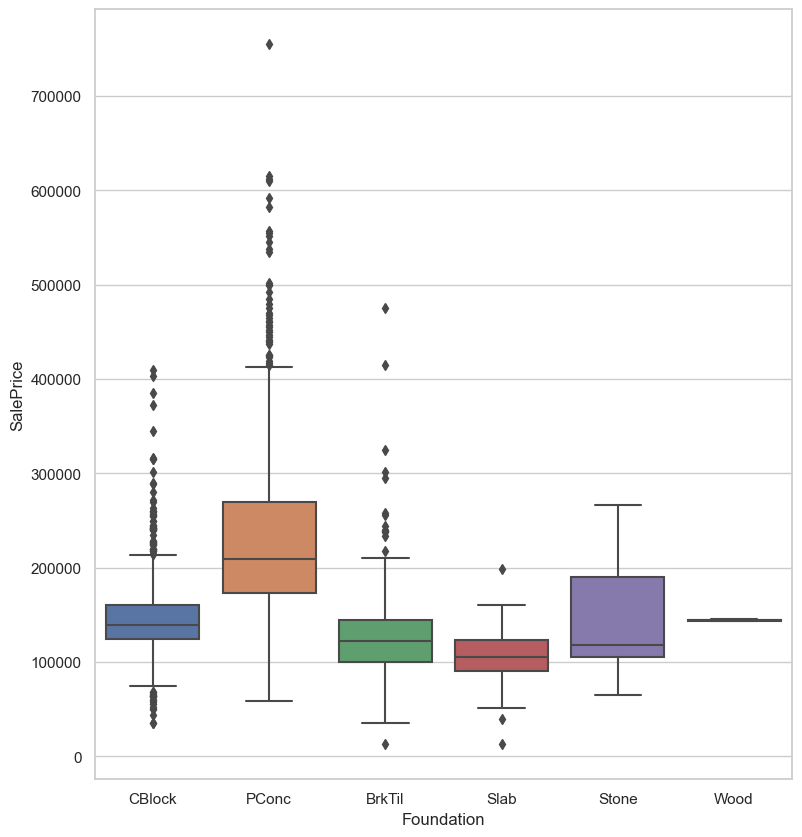

In [55]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(9,10))
sns.boxplot(x='Foundation',y='SalePrice',data=ames_df)

<AxesSubplot:xlabel='Central Air', ylabel='count'>

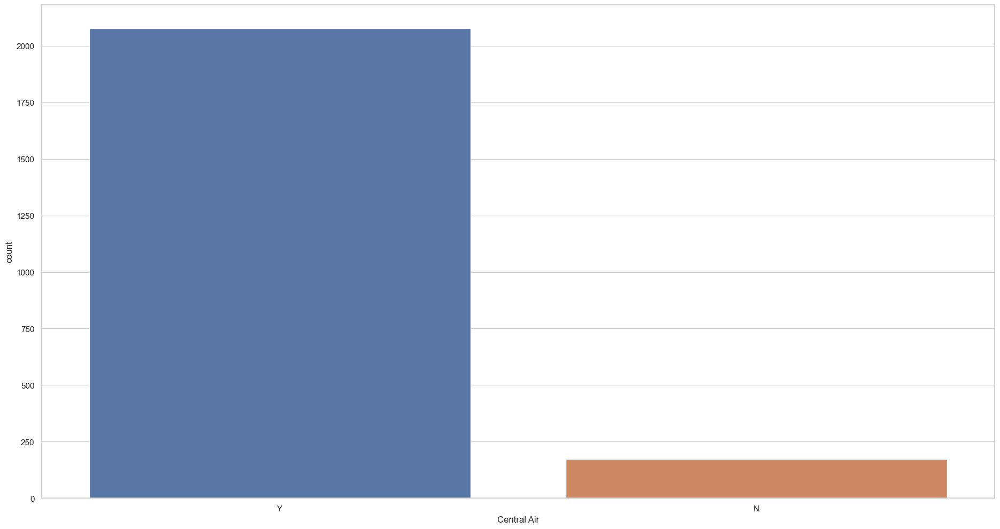

In [56]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Central Air"])

<AxesSubplot:xlabel='Central Air', ylabel='SalePrice'>

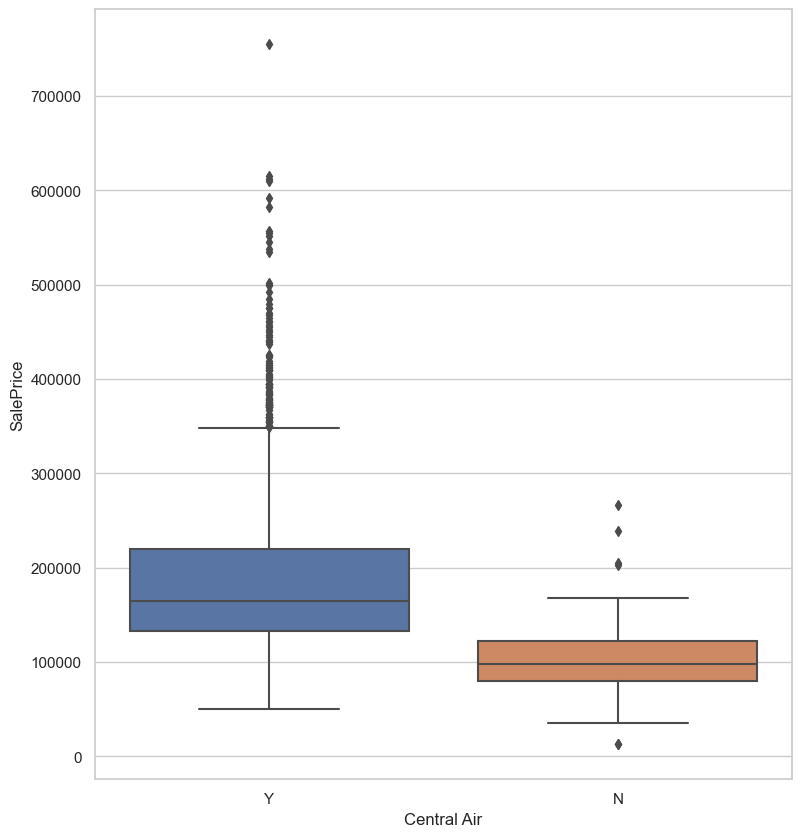

In [57]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(9,10))
sns.boxplot(x='Central Air',y='SalePrice',data=ames_df)

<AxesSubplot:xlabel='Full Bath', ylabel='count'>

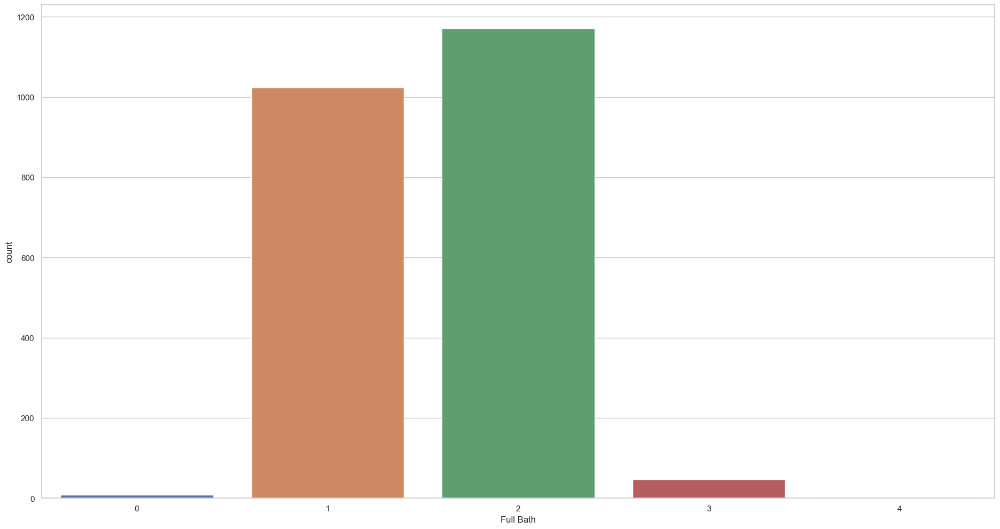

In [58]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Full Bath"])

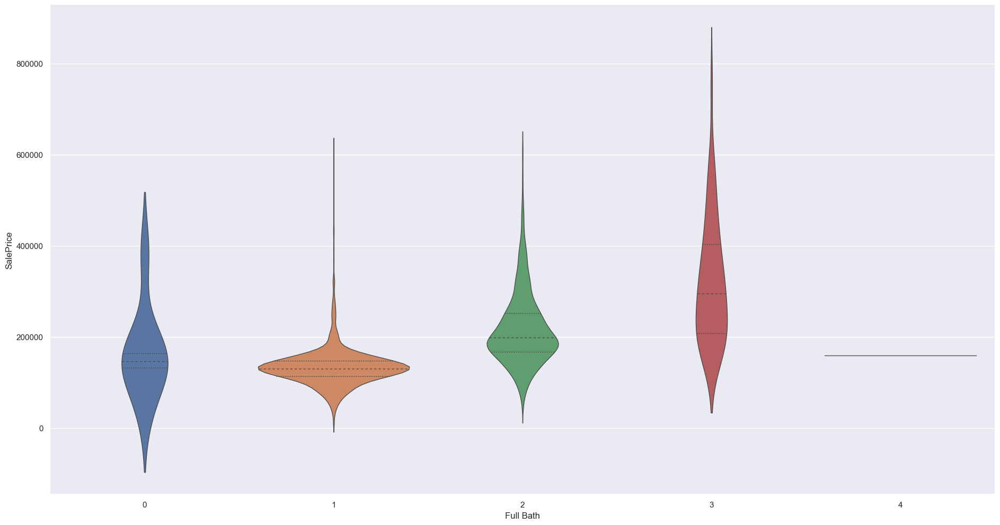

In [59]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="Full Bath", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='Full Bath', ylabel='SalePrice'>

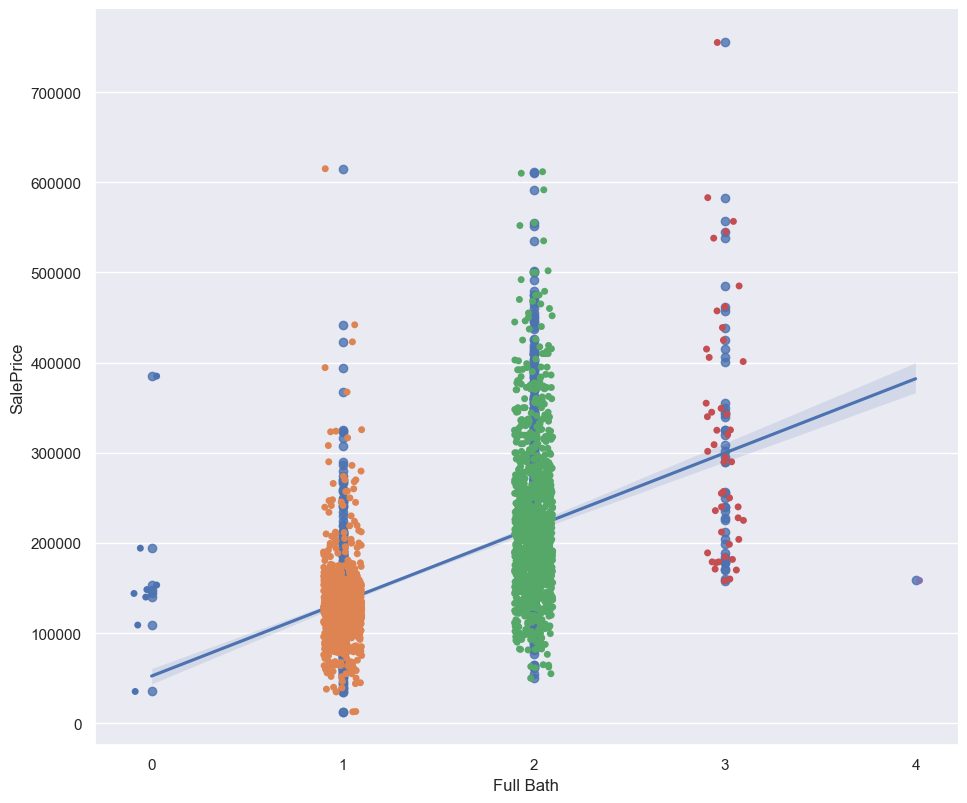

In [60]:
sns.set_theme()

sns.catplot(
    data=ames_df, x="Full Bath", y="SalePrice", height=8.2, aspect=1.2
)
sns.regplot(
    data=ames_df, x="Full Bath", y="SalePrice"
)

<AxesSubplot:xlabel='Half Bath', ylabel='count'>

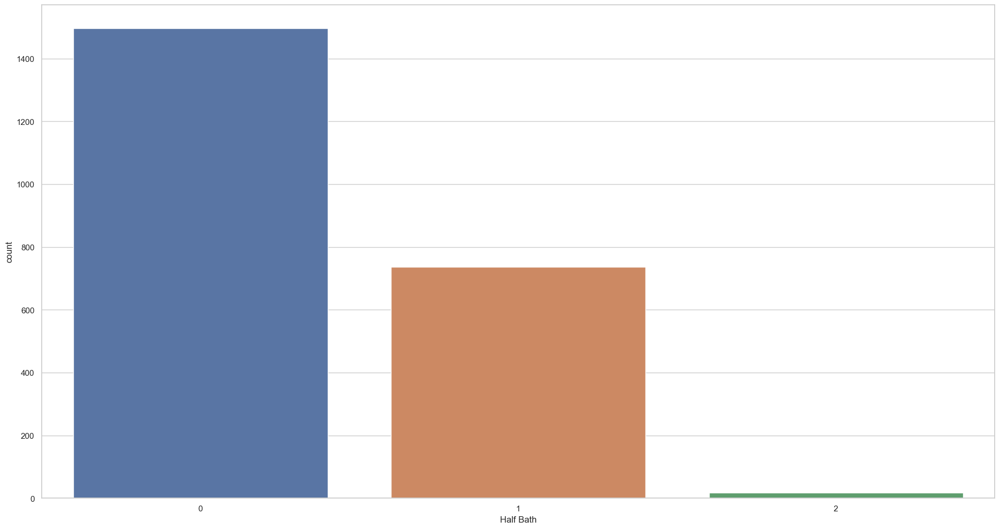

In [61]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Half Bath"])

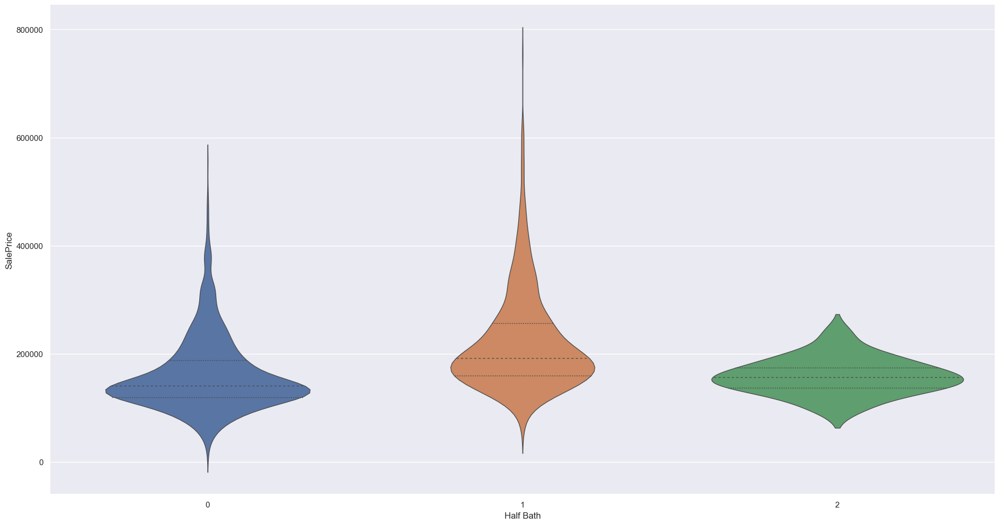

In [62]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(23.0, 12.0)})

sns.violinplot(data=ames_df, x="Half Bath", y="SalePrice",
               split=True, inner="quart", linewidth=1)

sns.despine(left=True)

<AxesSubplot:xlabel='Half Bath', ylabel='SalePrice'>

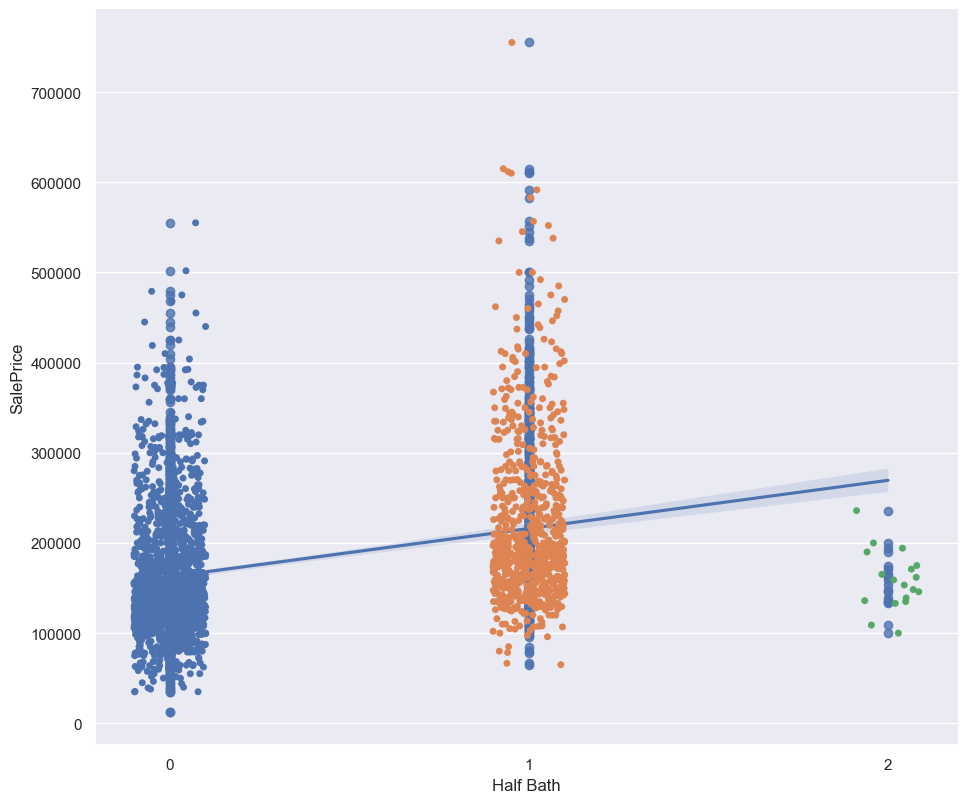

In [63]:
sns.set_theme()

sns.catplot(
    data=ames_df, x="Half Bath", y="SalePrice", height=8.2, aspect=1.2
)
sns.regplot(
    data=ames_df, x="Half Bath", y="SalePrice"
)

<AxesSubplot:xlabel='Bedroom AbvGr', ylabel='count'>

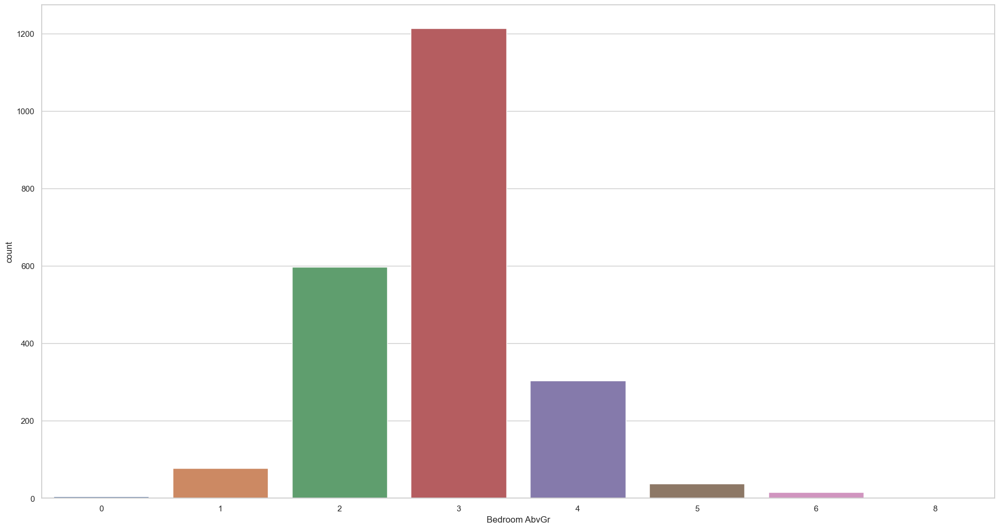

In [64]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Bedroom AbvGr"])

<AxesSubplot:xlabel='Garage Cars', ylabel='count'>

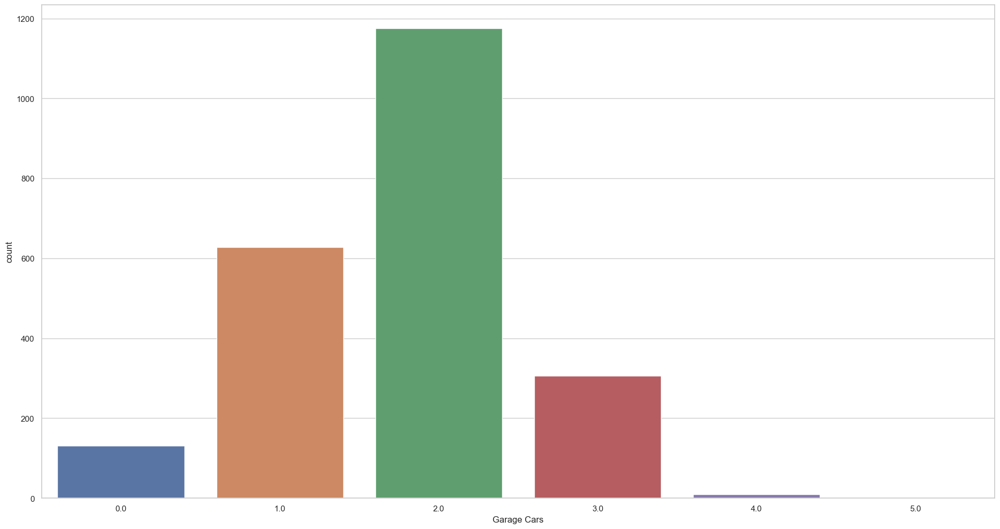

In [65]:
sns.set_theme(style="whitegrid")

sns.countplot(x=ames_df["Garage Cars"])

### Numerical Features

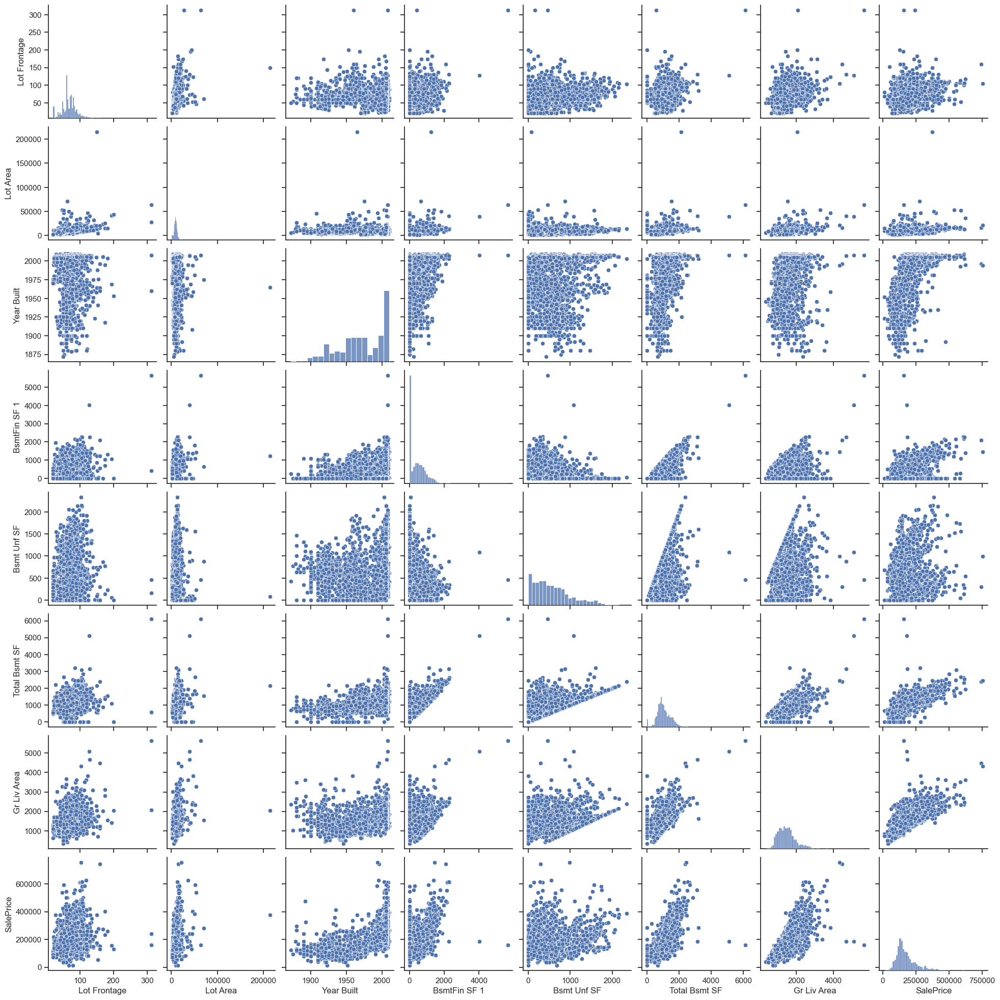

In [66]:
sns.set_theme(style="ticks")

sns.pairplot(ames_df_num)

<AxesSubplot:xlabel='Lot Frontage'>

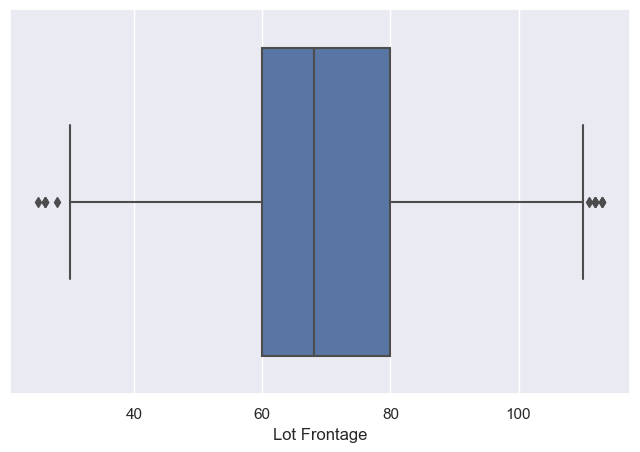

In [67]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["Lot Frontage"])

In [68]:
display(ames_df['Lot Frontage'].describe())

count    2251.000000
mean       68.709462
std        16.712577
min        25.000000
25%        60.000000
50%        68.000000
75%        80.000000
max       113.000000
Name: Lot Frontage, dtype: float64

<AxesSubplot:xlabel='Lot Area'>

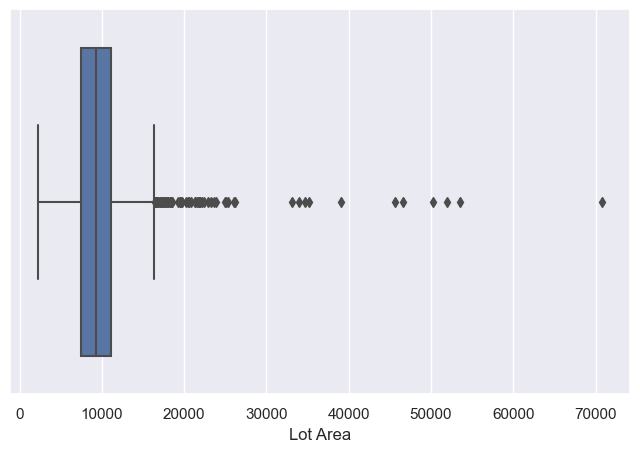

In [69]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["Lot Area"])

In [70]:
display(ames_df['Lot Area'].describe())

count     2251.000000
mean      9640.876944
std       4142.871066
min       2268.000000
25%       7500.000000
50%       9300.000000
75%      11069.500000
max      70761.000000
Name: Lot Area, dtype: float64

<AxesSubplot:xlabel='Year Built'>

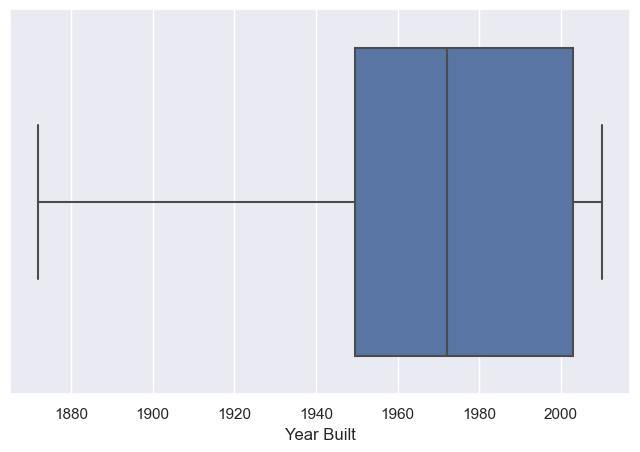

In [71]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["Year Built"])

In [72]:
display(ames_df['Year Built'].describe())

count    2251.000000
mean     1970.048423
std        32.143067
min      1872.000000
25%      1949.500000
50%      1972.000000
75%      2003.000000
max      2010.000000
Name: Year Built, dtype: float64

<AxesSubplot:xlabel='BsmtFin SF 1'>

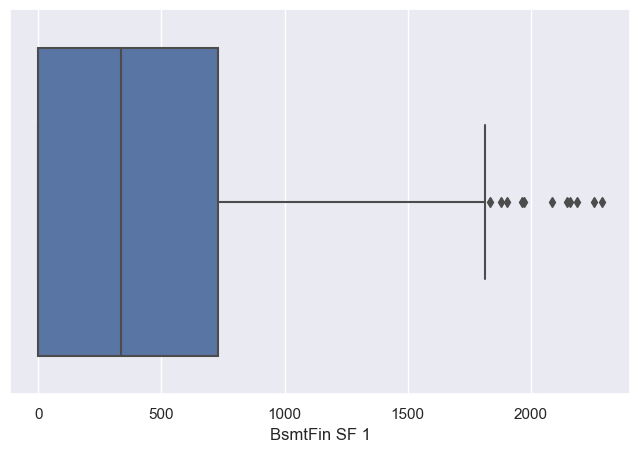

In [73]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["BsmtFin SF 1"])

In [74]:
display(ames_df['BsmtFin SF 1'].describe())

count    2251.000000
mean      423.209685
std       445.502452
min         0.000000
25%         0.000000
50%       338.000000
75%       728.000000
max      2288.000000
Name: BsmtFin SF 1, dtype: float64

<AxesSubplot:xlabel='Bsmt Unf SF'>

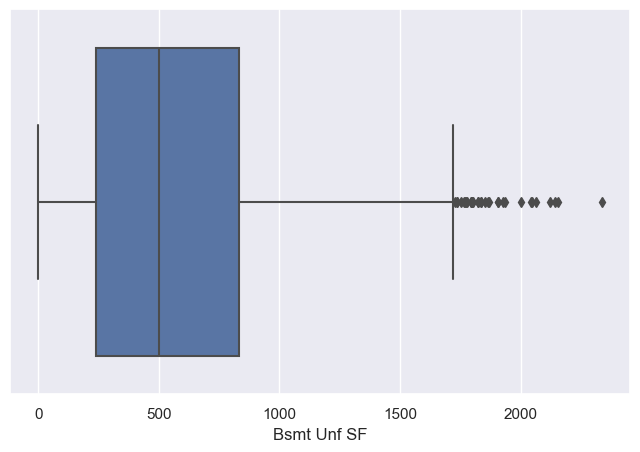

In [75]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["Bsmt Unf SF"])

In [76]:
display(ames_df['Bsmt Unf SF'].describe())

count    2251.000000
mean      588.403821
std       446.580574
min         0.000000
25%       240.000000
50%       501.000000
75%       833.500000
max      2336.000000
Name: Bsmt Unf SF, dtype: float64

<AxesSubplot:xlabel='Total Bsmt SF'>

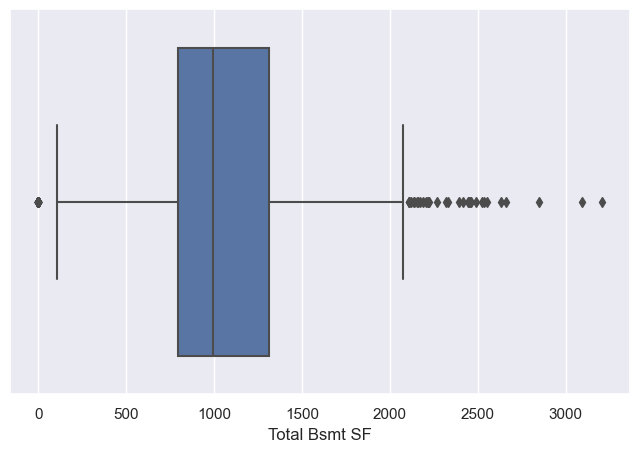

In [77]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["Total Bsmt SF"])

In [78]:
display(ames_df['Total Bsmt SF'].describe())

count    2251.000000
mean     1056.924478
std       423.969114
min         0.000000
25%       796.000000
50%       994.000000
75%      1311.500000
max      3206.000000
Name: Total Bsmt SF, dtype: float64

<AxesSubplot:xlabel='Gr Liv Area'>

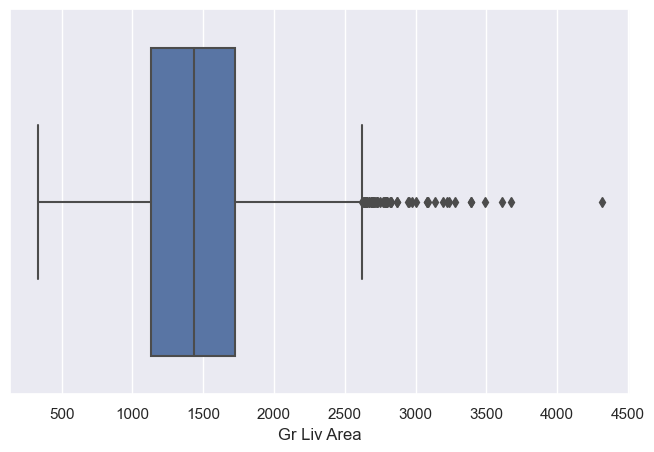

In [79]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["Gr Liv Area"])

In [80]:
display(ames_df['Gr Liv Area'].describe())

count    2251.000000
mean     1485.663705
std       481.636243
min       334.000000
25%      1131.000000
50%      1436.000000
75%      1728.000000
max      4316.000000
Name: Gr Liv Area, dtype: float64

<AxesSubplot:xlabel='SalePrice'>

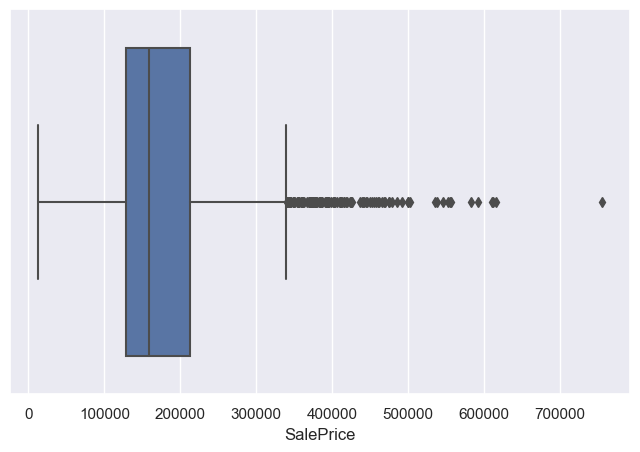

In [81]:
sns.set(rc={'figure.figsize':(8.0, 5.0)})
sns.boxplot(x=ames_df["SalePrice"])

In [82]:
display(ames_df['SalePrice'].describe())

count      2251.000000
mean     180980.808085
std       82025.048191
min       12789.000000
25%      128500.000000
50%      159000.000000
75%      213000.000000
max      755000.000000
Name: SalePrice, dtype: float64

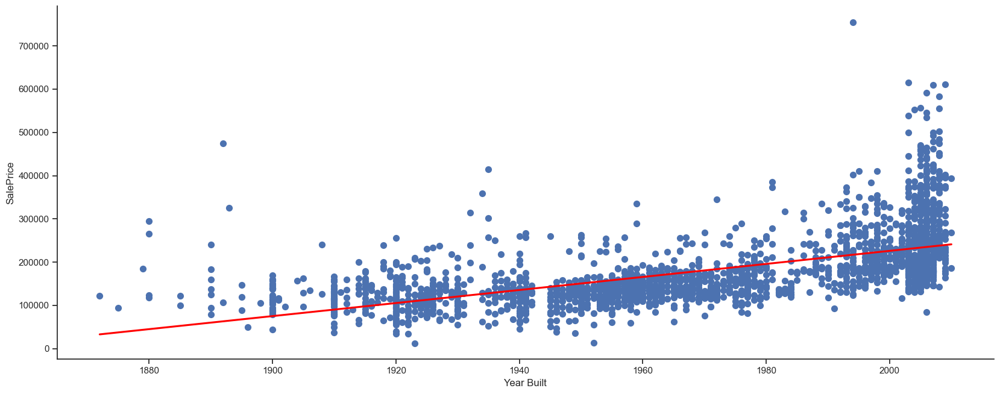

In [83]:
sns.set_theme(style="ticks")

sns.lmplot(
    data=ames_df, x="Year Built", y="SalePrice",
    palette=None, ci=None,
    height=6.7, aspect=2.5, fit_reg=True, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'}
)

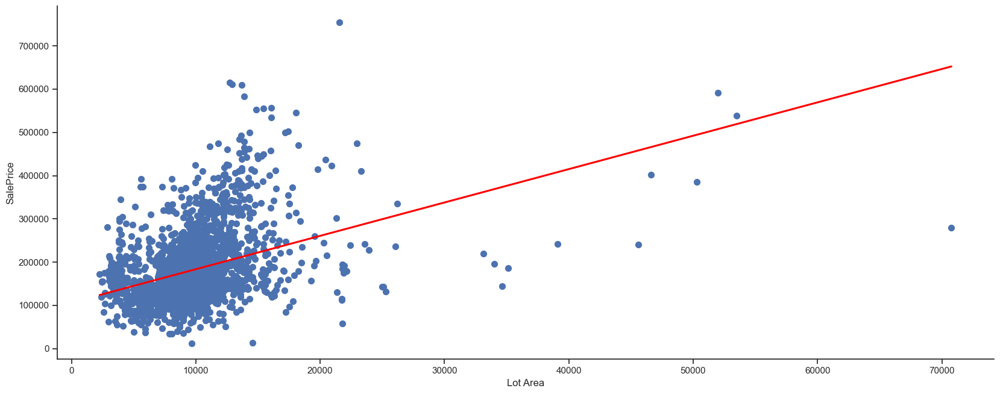

In [84]:
sns.set_theme(style="ticks")

sns.lmplot(
    data=ames_df, x="Lot Area", y="SalePrice",
    palette=None, ci=None,
    height=6.7, aspect=2.5, fit_reg=True, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'}
)

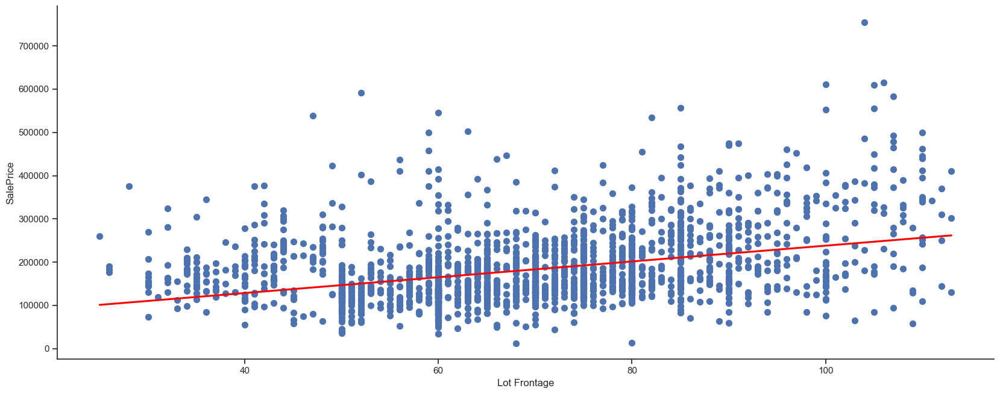

In [85]:
sns.set_theme(style="ticks")

sns.lmplot(
    data=ames_df, x="Lot Frontage", y="SalePrice",
    palette=None, ci=None,
    height=6.7, aspect=2.5, fit_reg=True, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'}
)

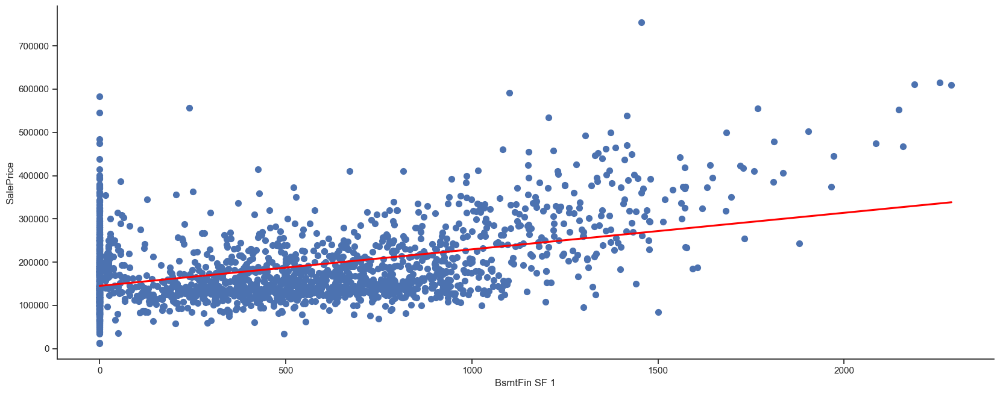

In [86]:
sns.set_theme(style="ticks")

sns.lmplot(
    data=ames_df, x="BsmtFin SF 1", y="SalePrice",
    palette=None, ci=None,
    height=6.7, aspect=2.5, fit_reg=True, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'}
)

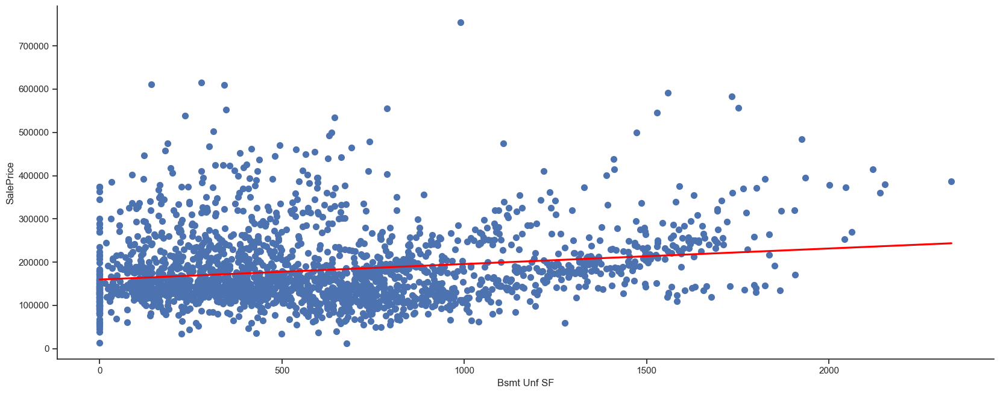

In [87]:
sns.set_theme(style="ticks")

sns.lmplot(
    data=ames_df, x="Bsmt Unf SF", y="SalePrice",
    palette=None, ci=None,
    height=6.7, aspect=2.5, fit_reg=True, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'}
)

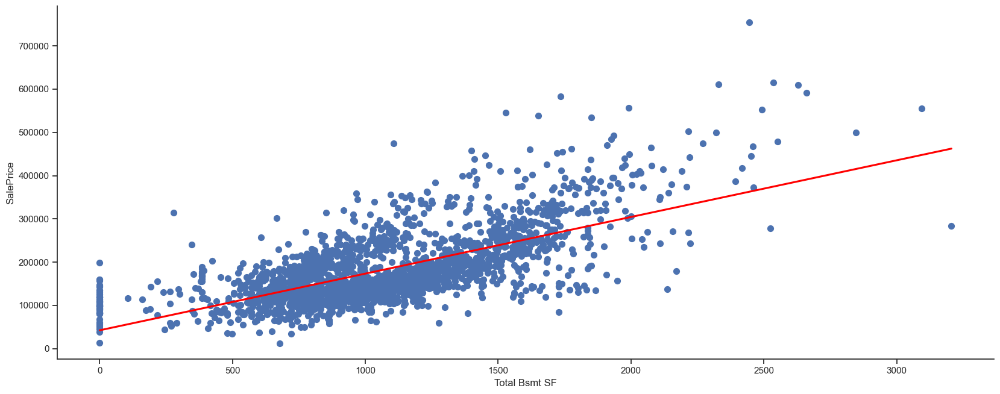

In [88]:
sns.set_theme(style="ticks")

sns.lmplot(
    data=ames_df, x="Total Bsmt SF", y="SalePrice",
    palette=None, ci=None,
    height=6.7, aspect=2.5, fit_reg=True, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'}
)

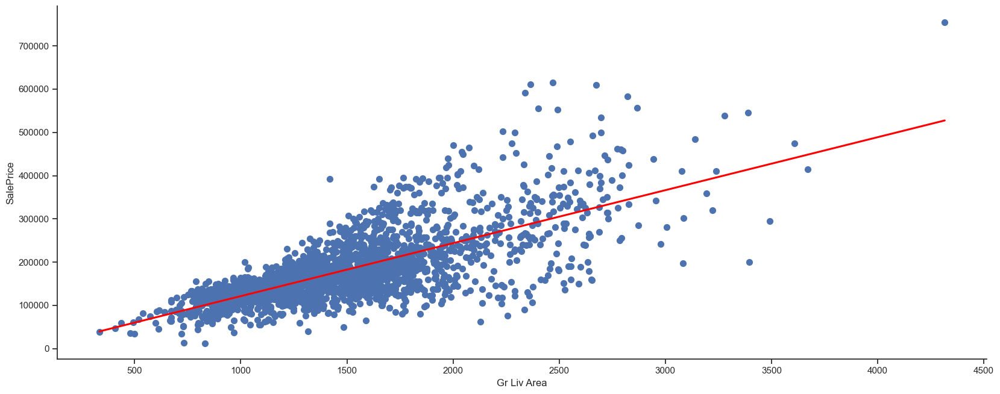

In [89]:
sns.set_theme(style="ticks")

sns.lmplot(
    data=ames_df, x="Gr Liv Area", y="SalePrice",
    palette=None, ci=None,
    height=6.7, aspect=2.5, fit_reg=True, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'}
)

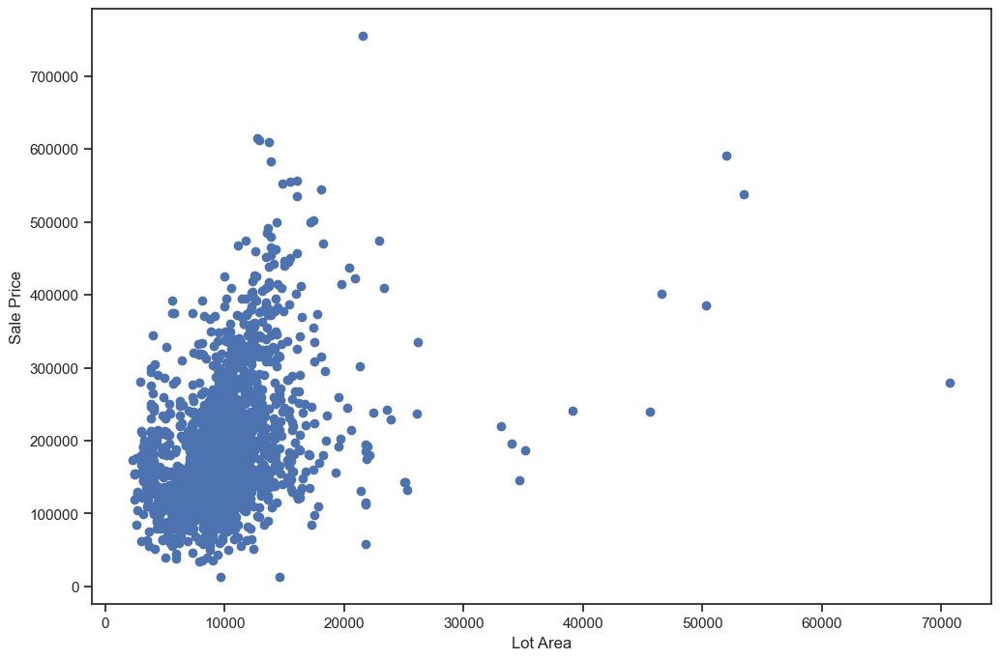

In [90]:
fig, ax = plt.subplots()
fig.set_size_inches(12, 8)
ax.scatter(ames_df["Lot Area"], ames_df["SalePrice"])
plt.xlabel('Lot Area')
plt.ylabel('Sale Price')

plt.show()

In [91]:
print(ames_df_num.columns.tolist())

['Lot Frontage', 'Lot Area', 'Year Built', 'BsmtFin SF 1', 'Bsmt Unf SF', 'Total Bsmt SF', 'Gr Liv Area', 'SalePrice']


In [92]:
z = np.abs(stats.zscore(ames_df_num))
z

,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,SalePrice
0,3.072881,3.433269,0.334635,0.458256,0.307150,0.064326,0.329791,0.417451
1,0.461479,0.297381,0.302919,0.089063,0.691711,0.375642,1.171841,0.900304
2,0.504289,0.709056,0.398065,1.071417,0.385861,0.617618,0.316306,0.097672
3,1.018007,0.225474,0.080914,1.377997,1.051182,2.353047,1.226819,0.764859
4,0.204620,0.641040,0.838824,0.786426,0.990814,0.273427,0.276444,0.116763
5,0.375859,0.041504,0.870539,0.378372,0.570271,0.277871,0.227048,0.183849
6,1.208106,0.745736,0.965684,0.408598,0.324789,0.637617,0.298523,0.399481
7,1.122486,0.732506,0.680248,0.353535,0.988213,0.508738,0.413122,0.135930
8,1.293725,0.672740,0.775394,1.626284,0.365621,1.208686,0.250758,0.675012
9,0.394718,0.344178,0.902254,0.921357,0.936488,0.126771,0.622215,0.105981


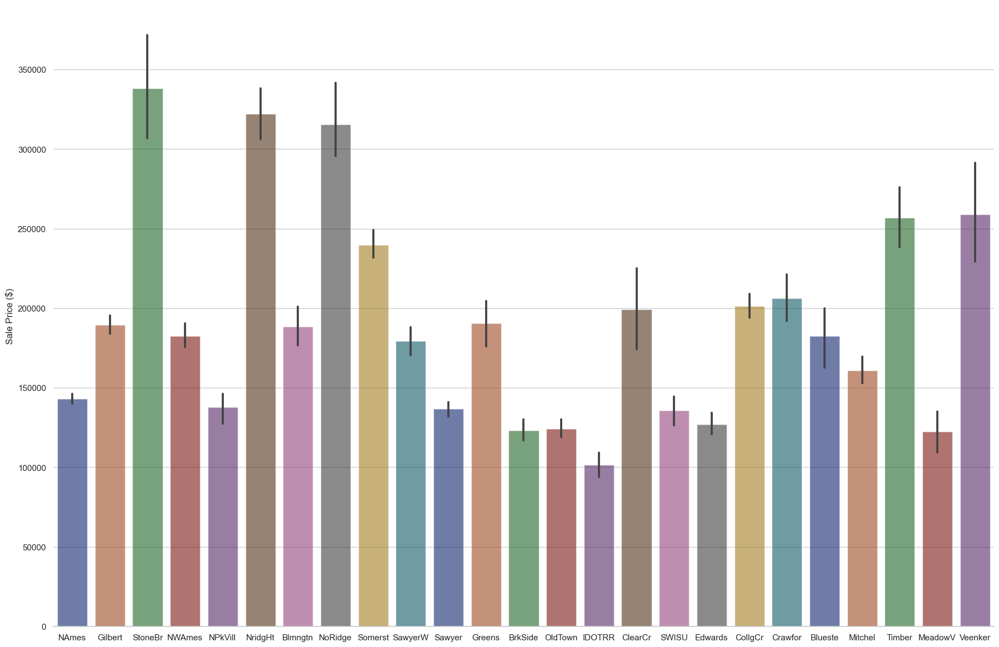

In [93]:
sns.set_theme(style="whitegrid")

neighborhood_plot = sns.catplot(
data=ames_df, kind="bar",
x="Neighborhood", y="SalePrice",
palette="dark", alpha=0.6, height=6
)

neighborhood_plot.fig.set_size_inches(22, 13)
neighborhood_plot.despine(left=True)
neighborhood_plot.set_axis_labels("", "Sale Price ($)")

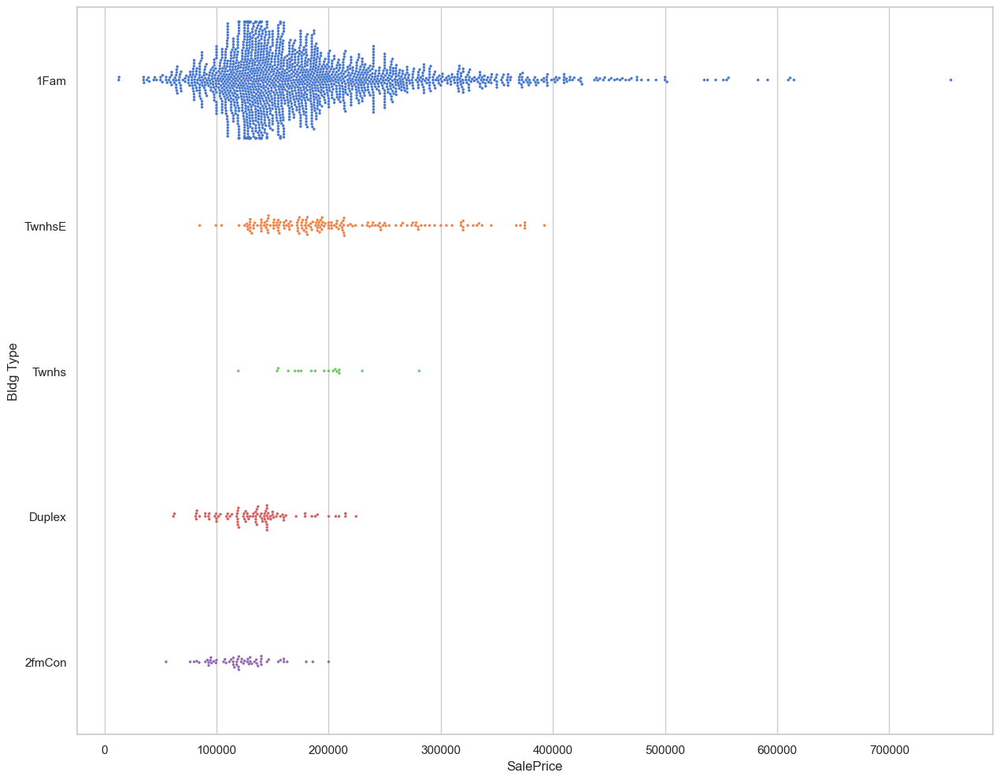

In [94]:
sns.set_theme(style="whitegrid", palette="muted")
fig, ax = plt.subplots(figsize=(15,12))

sns.swarmplot(data=ames_df, x="SalePrice", y="Bldg Type", dodge=True, s=2.5)
plt.show()

In [95]:
ames_df_corr = ames_df.corr()
ames_df_corr

,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Garage Cars,SalePrice
Lot Frontage,1.000000,0.421921,0.228252,-0.094244,0.192155,0.162173,0.118554,0.310366,0.351979,0.203163,0.141898,0.275871,0.313010,0.371776
Lot Area,0.421921,1.000000,0.185902,-0.065817,0.119308,0.189797,0.058468,0.278708,0.353849,0.177745,0.161276,0.202415,0.262263,0.389597
Overall Qual,0.228252,0.185902,1.000000,-0.129886,0.617129,0.286295,0.285478,0.579317,0.579999,0.532469,0.273000,0.052236,0.613535,0.821007
Overall Cond,-0.094244,-0.065817,-0.129886,1.000000,-0.404647,-0.070590,-0.145344,-0.205639,-0.143553,-0.253348,-0.093795,-0.013438,-0.211497,-0.144006
Year Built,0.192155,0.119308,0.617129,-0.404647,1.000000,0.291711,0.154828,0.461425,0.250804,0.482774,0.258944,-0.060517,0.558825,0.590983
BsmtFin SF 1,0.162173,0.189797,0.286295,-0.070590,0.291711,1.000000,-0.508347,0.498351,0.166481,0.067091,0.004699,-0.132675,0.246738,0.458696
Bsmt Unf SF,0.118554,0.058468,0.285478,-0.145344,0.154828,-0.508347,1.000000,0.427894,0.251365,0.290300,-0.017584,0.179746,0.204670,0.195312
Total Bsmt SF,0.310366,0.278708,0.579317,-0.205639,0.461425,0.498351,0.427894,1.000000,0.419237,0.342377,-0.024473,0.043937,0.466136,0.676994
Gr Liv Area,0.351979,0.353849,0.579999,-0.143553,0.250804,0.166481,0.251365,0.419237,1.000000,0.628876,0.459098,0.520082,0.490864,0.719095
Full Bath,0.203163,0.177745,0.532469,-0.253348,0.482774,0.067091,0.290300,0.342377,0.628876,1.000000,0.146263,0.325984,0.474125,0.548626


<AxesSubplot:>

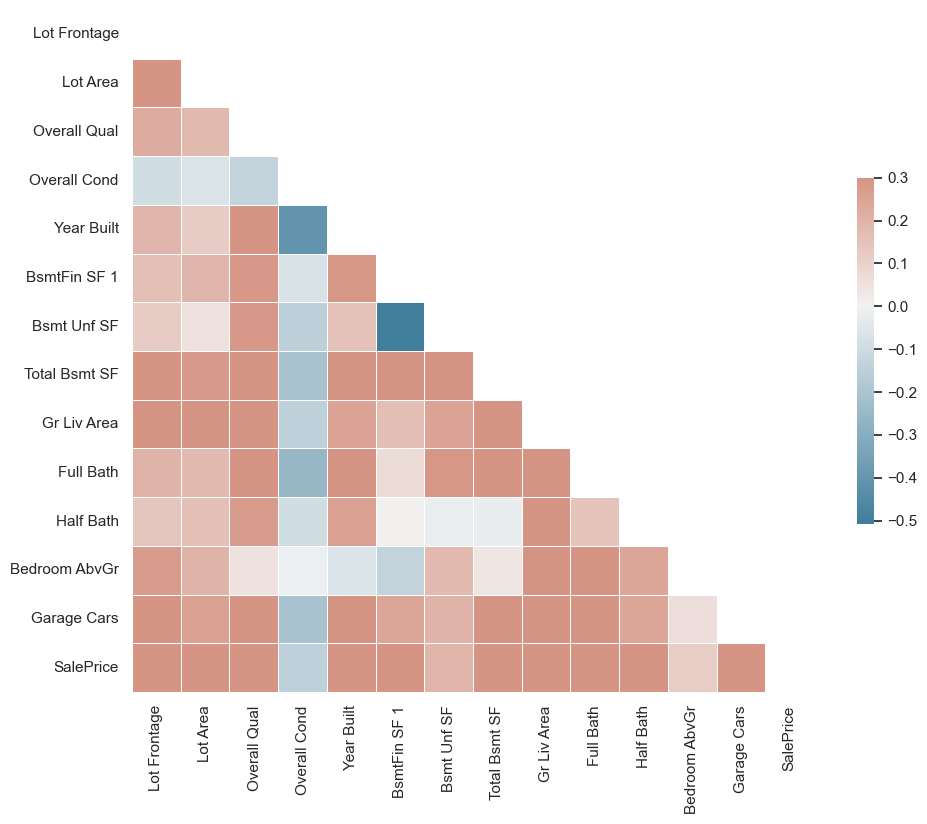

In [96]:
mask = np.triu(np.ones_like(ames_df_corr, dtype=bool))

fig, ax = plt.subplots(figsize=(11,9))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(ames_df_corr, mask=mask, cmap=cmap, vmax=0.3, center=0,
           square=True, linewidths=0.5, cbar_kws={"shrink": 0.5})

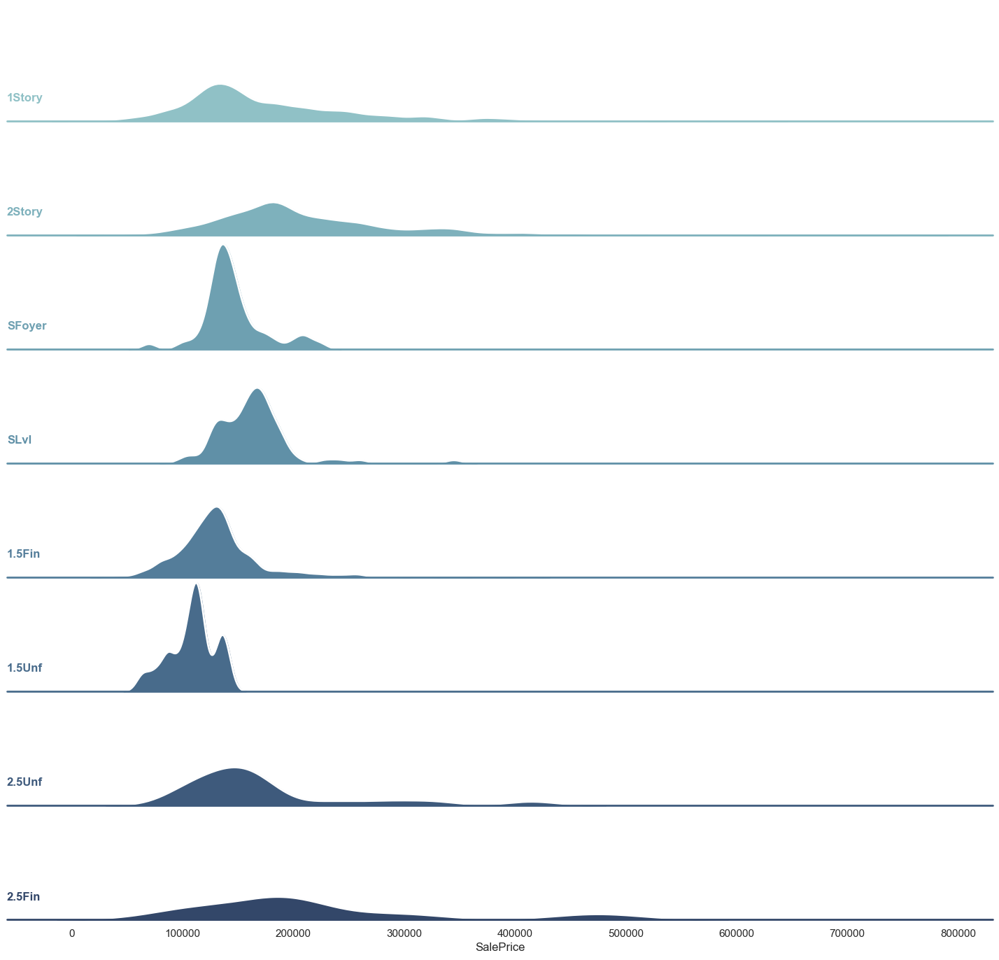

In [97]:
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(ames_df, row="House Style", hue="House Style", aspect=15, height=1, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "SalePrice",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, "SalePrice", clip_on=False, color="w", lw=2, bw_adjust=.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, "SalePrice")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=0)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.fig.set_size_inches(15, 15)
g.despine(bottom=True, left=True)

<AxesSubplot:xlabel='Gr Liv Area', ylabel='SalePrice'>

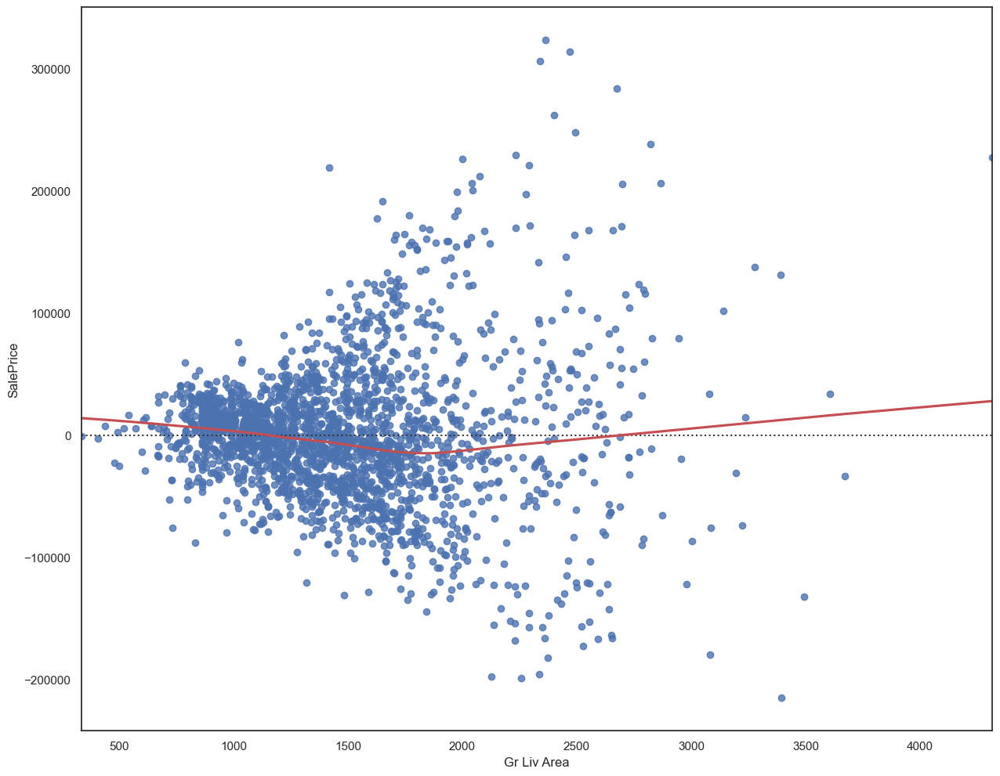

In [98]:
fig, ax = plt.subplots(figsize=(15,12))

sns.residplot(data=ames_df, x='Gr Liv Area', y='SalePrice', lowess=True, color="b", line_kws=dict(color="r"))

<AxesSubplot:xlabel='Lot Area', ylabel='SalePrice'>

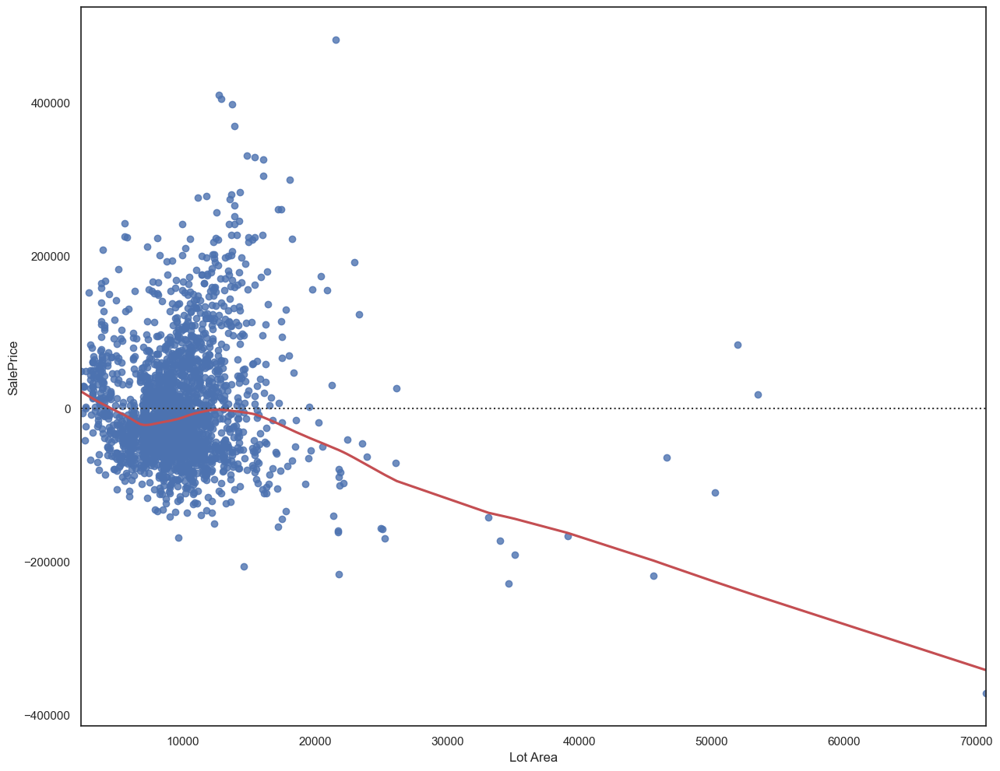

In [99]:
fig, ax = plt.subplots(figsize=(15,12))

sns.residplot(data=ames_df, x='Lot Area', y='SalePrice', lowess=True, color="b", line_kws=dict(color="r"))

<AxesSubplot:xlabel='Lot Area', ylabel='SalePrice'>

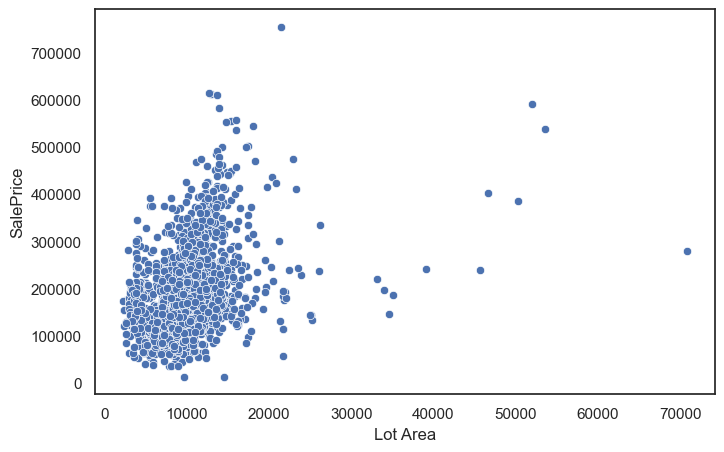

In [100]:
sns.scatterplot(data=ames_df, x="Lot Area", y="SalePrice")

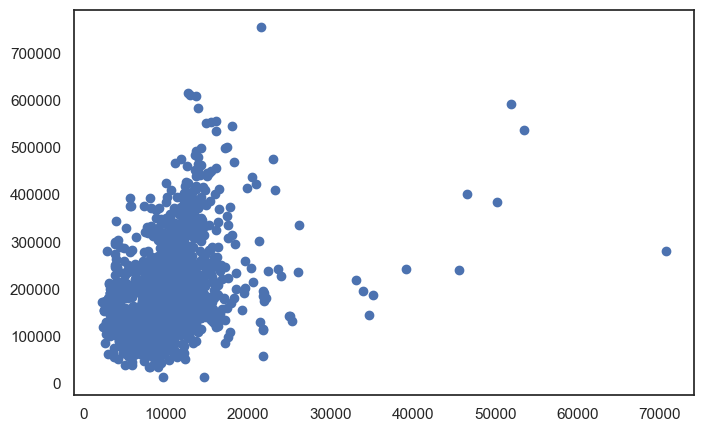

In [101]:
fig, ax = plt.subplots()

ax.scatter(ames_df["Lot Area"], ames_df["SalePrice"])

plt.show()

In [102]:
z_score_price = np.abs(stats.zscore(ames_df['SalePrice']))
print(z_score_price)

1       0.926518
2       0.109513
3       0.768463
4       0.108762
5       0.177049
6       0.396542
7       0.128272
8       0.677007
9       0.097787
10      0.061956
12      0.007082
13      0.115610
15      4.353530
17      2.602847
19      0.353863
20      0.109981
21      0.133901
25      0.475336
26      0.670442
27      0.804577
28      0.036816
32      0.652151
36      2.380060
37      1.524497
38      2.612114
39      1.340866
40      0.475804
41      1.146480
42      0.951374
43      0.402640
44      5.251711
45      0.524581
46      3.890154
47      1.695215
48      1.693995
49      0.292893
50      0.066834
51      0.225825
52      0.255842
53      0.134369
54      0.042913
56      0.050084
59      1.855787
60      2.122009
61      0.968446
62      1.756185
63      1.329392
64      0.487998
65      2.792684
66      0.494095
67      0.286796
68      0.417272
69      0.994054
70      0.901379
71      1.103801
72      0.634328
73      0.000234
75      0.463142
76      0.0977

In [103]:
type(z_score_price)

pandas.core.series.Series

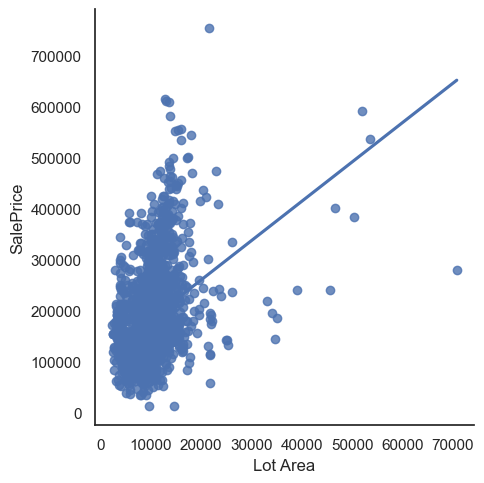

In [104]:
lineplots = sns.lmplot(data=ames_df, x='Lot Area', y='SalePrice', ci=None)
lineplots.set_titles(size=14)
plt.show()

In [105]:
print("Variance: % s" %(statistics.variance(ames_df['SalePrice'].to_numpy())))

Variance: 6728108530


In [106]:
print("Variance: % s" %(statistics.variance(ames_df['Gr Liv Area'].to_numpy())))

Variance: 231973


## Model Prep

In [108]:
print(ames_df.columns.tolist())

['Lot Frontage', 'Lot Area', 'Lot Config', 'Neighborhood', 'Bldg Type', 'House Style', 'Overall Qual', 'Overall Cond', 'Year Built', 'Foundation', 'BsmtFin SF 1', 'Bsmt Unf SF', 'Total Bsmt SF', 'Central Air', 'Gr Liv Area', 'Full Bath', 'Half Bath', 'Bedroom AbvGr', 'Garage Cars', 'SalePrice']


In [109]:
ames_df.drop(ames_df[ames_df['Bedroom AbvGr'] == 8].index, inplace=True)

In [110]:
ames_df_nn = ames_df

In [111]:
for feature in ames_features:
    print("Feature", feature, "has % s" %ames_df[feature].unique())

Feature Lot Config has ['Inside' 'Corner' 'CulDSac' 'FR2' 'FR3']
Feature Neighborhood has ['NAmes' 'Gilbert' 'StoneBr' 'NWAmes' 'NPkVill' 'NridgHt' 'Blmngtn'
 'NoRidge' 'Somerst' 'SawyerW' 'Sawyer' 'Greens' 'BrkSide' 'OldTown'
 'IDOTRR' 'ClearCr' 'SWISU' 'Edwards' 'CollgCr' 'Crawfor' 'Blueste'
 'Mitchel' 'Timber' 'MeadowV' 'Veenker']
Feature Bldg Type has ['1Fam' 'TwnhsE' 'Twnhs' 'Duplex' '2fmCon']
Feature House Style has ['1Story' '2Story' 'SFoyer' 'SLvl' '1.5Fin' '1.5Unf' '2.5Unf' '2.5Fin']
Feature Overall Qual has [ 5  6  7  8  9  4  3  2 10  1]
Feature Overall Cond has [6 5 2 7 8 4 9 3 1]
Feature Foundation has ['CBlock' 'PConc' 'BrkTil' 'Slab' 'Stone' 'Wood']
Feature Central Air has ['Y' 'N']
Feature Full Bath has [1 2 3 0 4]
Feature Half Bath has [0 1 2]
Feature Bedroom AbvGr has [2 3 4 1 6 5 0]
Feature Garage Cars has [1. 2. 3. 0. 4. 5.]


In [112]:
##note** make function
X_pipe=ames_df.drop(['SalePrice'], axis=1)
y_pipe=ames_df['SalePrice']
#Making a list of numerical features in the dataset
ames_df_num_pipe = X_pipe.select_dtypes(exclude="object").columns

#Making a list of catigorical features in the dataset
ames_df_cat_pipe = X_pipe.select_dtypes(include="object").columns

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), ames_df_cat_pipe),  # OneHotEncoder for categorical features
        ('num', SimpleImputer(), ames_df_num_pipe)  # SimpleImputer for numerical features
    ])

classifier = GradientBoostingRegressor()

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),# Apply the preprocessor to the data
    ('classifier', classifier)
])

X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe = train_test_split(X_pipe, y_pipe, test_size=0.2, random_state=42)

pipeline.fit(X_train_pipe, y_train_pipe)

pipe_score = pipeline.score(X_test_pipe, y_test_pipe)

print(f"The score for the gradient boosted regressioon model is {pipe_score}")

The score for the gradient boosted regressioon model is 0.9153921701843273


In [113]:
new_data = pd.DataFrame({
    'Lot Frontage': [65, 80, 68],
    'Lot Area': [8450, 9600, 11250],
    'Lot Config': ['Inside', 'Inside', 'Corner'],
    'Neighborhood': ['NWAmes', 'NridgHt', 'CollgCr'],
    'Bldg Type': ['1Fam', 'Twnhs', '1Fam'],
    'House Style': ['1Story', '2Story', '2Story'],
    'Overall Qual': [7, 6, 7],
    'Overall Cond': [5, 6, 5],
    'Year Built': [2003, 1976, 2001],
    'Foundation': ['PConc', 'CBlock', 'PConc'],
    'BsmtFin SF 1': [706, 978, 486],
    'Bsmt Unf SF': [150, 284, 434],
    'Total Bsmt SF': [856, 1262, 920],
    'Central Air': ['Y', 'Y', 'Y'],
    'Gr Liv Area': [1710, 1262, 1786],
    'Full Bath': [2, 2, 2],
    'Half Bath': [1, 0, 1],
    'Bedroom AbvGr': [3, 3, 3],
    'Garage Cars': [2, 2, 2]
})

pipe_predictions = pipeline.predict(new_data)
pipe_predictions_graph = pipeline.predict(X_test_pipe)
print(pipe_predictions)

[199461.97543335 163639.1499744  211232.21107309]


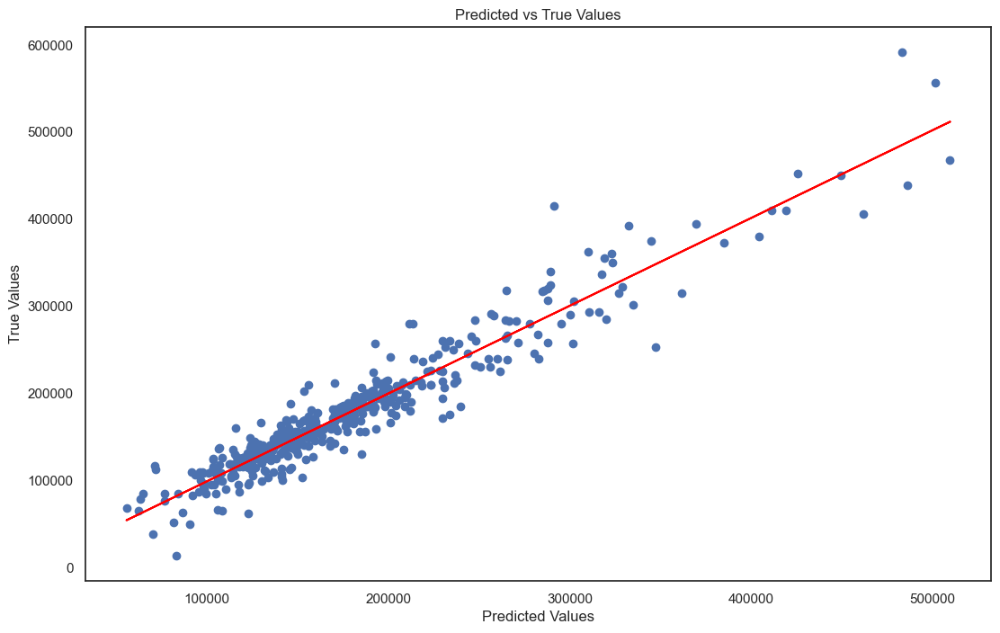

In [114]:
plt.figure(figsize=(13,8))
plt.scatter(pipe_predictions_graph, y_test_pipe)
m, b = np.polyfit(pipe_predictions_graph, y_test_pipe, deg=1)
plt.plot(pipe_predictions_graph, m*pipe_predictions_graph+b, color="red")
plt.xlabel('Predicted Values')
plt.ylabel('True Values')
plt.title('Predicted vs True Values')
plt.show()

### Regression

In [115]:
columns_to_encode=['Lot Config', 'Neighborhood', 'Bldg Type', 'House Style', 'Overall Qual', 'Overall Cond',
                                       'Foundation', 'Central Air', 'Full Bath', 'Half Bath', 'Bedroom AbvGr', 'Garage Cars']

In [116]:
# create a OneHotEncoder object with the specified columns
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
encoded_cols = pd.DataFrame(encoder.fit_transform(ames_df[columns_to_encode]))

# rename the encoded columns using get_feature_names_out
encoded_cols.columns = encoder.get_feature_names(columns_to_encode)

# drop the original columns and add the encoded columns to the dataframe
ames_df = ames_df.drop(columns_to_encode, axis=1).reset_index(drop=True)
ames_df = pd.concat([ames_df, encoded_cols], axis=1)

In [117]:
ames_df.head()

,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,SalePrice,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Bldg Type_1Fam,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Fin,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Overall Qual_1,Overall Qual_2,Overall Qual_3,Overall Qual_4,Overall Qual_5,Overall Qual_6,Overall Qual_7,Overall Qual_8,Overall Qual_9,Overall Qual_10,Overall Cond_1,Overall Cond_2,Overall Cond_3,Overall Cond_4,Overall Cond_5,Overall Cond_6,Overall Cond_7,Overall Cond_8,Overall Cond_9,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Central Air_N,Central Air_Y,Full Bath_0,Full Bath_1,Full Bath_2,Full Bath_3,Full Bath_4,Half Bath_0,Half Bath_1,Half Bath_2,Bedroom AbvGr_0,Bedroom AbvGr_1,Bedroom AbvGr_2,Bedroom AbvGr_3,Bedroom AbvGr_4,Bedroom AbvGr_5,Bedroom AbvGr_6,Garage Cars_0.0,Garage Cars_1.0,Garage Cars_2.0,Garage Cars_3.0,Garage Cars_4.0,Garage Cars_5.0
0,80.0,11622,1961,468.0,270.0,882.0,896,105000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,81.0,14267,1958,923.0,406.0,1329.0,1329,172000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,93.0,11160,1968,1065.0,1045.0,2110.0,2110,244000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,74.0,13830,1997,791.0,137.0,928.0,1629,189900,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,78.0,9978,1998,602.0,324.0,926.0,1604,195500,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [118]:
X=ames_df.drop(['SalePrice'], axis=1)

In [119]:
y=ames_df['SalePrice']

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [121]:
encoder.categories_

[array(['Corner', 'CulDSac', 'FR2', 'FR3', 'Inside'], dtype=object),
 array(['Blmngtn', 'Blueste', 'BrkSide', 'ClearCr', 'CollgCr', 'Crawfor',
        'Edwards', 'Gilbert', 'Greens', 'IDOTRR', 'MeadowV', 'Mitchel',
        'NAmes', 'NPkVill', 'NWAmes', 'NoRidge', 'NridgHt', 'OldTown',
        'SWISU', 'Sawyer', 'SawyerW', 'Somerst', 'StoneBr', 'Timber',
        'Veenker'], dtype=object),
 array(['1Fam', '2fmCon', 'Duplex', 'Twnhs', 'TwnhsE'], dtype=object),
 array(['1.5Fin', '1.5Unf', '1Story', '2.5Fin', '2.5Unf', '2Story',
        'SFoyer', 'SLvl'], dtype=object),
 array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64),
 array([1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64),
 array(['BrkTil', 'CBlock', 'PConc', 'Slab', 'Stone', 'Wood'], dtype=object),
 array(['N', 'Y'], dtype=object),
 array([0, 1, 2, 3, 4], dtype=int64),
 array([0, 1, 2], dtype=int64),
 array([0, 1, 2, 3, 4, 5, 6], dtype=int64),
 array([0., 1., 2., 3., 4., 5.])]

In [122]:
display(X_train.describe())

,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Bldg Type_1Fam,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Fin,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Overall Qual_1,Overall Qual_2,Overall Qual_3,Overall Qual_4,Overall Qual_5,Overall Qual_6,Overall Qual_7,Overall Qual_8,Overall Qual_9,Overall Qual_10,Overall Cond_1,Overall Cond_2,Overall Cond_3,Overall Cond_4,Overall Cond_5,Overall Cond_6,Overall Cond_7,Overall Cond_8,Overall Cond_9,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Central Air_N,Central Air_Y,Full Bath_0,Full Bath_1,Full Bath_2,Full Bath_3,Full Bath_4,Half Bath_0,Half Bath_1,Half Bath_2,Bedroom AbvGr_0,Bedroom AbvGr_1,Bedroom AbvGr_2,Bedroom AbvGr_3,Bedroom AbvGr_4,Bedroom AbvGr_5,Bedroom AbvGr_6,Garage Cars_0.0,Garage Cars_1.0,Garage Cars_2.0,Garage Cars_3.0,Garage Cars_4.0,Garage Cars_5.0
count,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000,1800.000000
mean,68.634444,9627.074444,1970.114444,431.222222,589.036667,1064.836111,1485.548889,0.156111,0.041111,0.021667,0.003889,0.777222,0.009444,0.001111,0.044444,0.008889,0.095000,0.039444,0.072778,0.041111,0.003889,0.038333,0.003889,0.040000,0.156667,0.001667,0.035000,0.021111,0.070556,0.096111,0.020556,0.041667,0.046111,0.060556,0.020556,0.025000,0.006111,0.852222,0.024444,0.037778,0.008889,0.076667,0.122778,0.007778,0.531111,0.003333,0.008889,0.263889,0.025556,0.036667,0.000556,0.006667,0.013889,0.075556,0.291667,0.228889,0.198333,0.130000,0.043333,0.011111,0.000556,0.002778,0.016667,0.035556,0.571667,0.176667,0.135556,0.047778,0.012778,0.124444,0.389444,0.462222,0.017778,0.005556,0.000556,0.077222,0.922778,0.003889,0.459444,0.515000,0.021111,0.000556,0.666667,0.326667,0.006667,0.002778,0.033889,0.270000,0.535000,0.135556,0.015000,0.007778,0.058889,0.281111,0.513333,0.141111,0.005000,0.000556
std,16.690550,3996.228125,32.107608,450.963739,446.623888,426.884407,484.737441,0.363062,0.198602,0.145633,0.062257,0.416226,0.096749,0.033324,0.206138,0.093887,0.293296,0.194704,0.259844,0.198602,0.062257,0.192053,0.062257,0.196014,0.363587,0.040802,0.183831,0.143795,0.25615

In [123]:
display(y_train.describe())

count      1800.000000
mean     182314.841667
std       83443.077251
min       12789.000000
25%      128500.000000
50%      159000.000000
75%      217350.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [124]:
from sklearn.linear_model import LinearRegression


lm = LinearRegression()
model_lm = lm.fit(X_train, y_train)

In [125]:
model_lm.score(X_test, y_test)

0.9221087050128411

In [126]:
model_lm.get_params()

{'copy_X': True,
 'fit_intercept': True,
 'n_jobs': None,
 'normalize': False,
 'positive': False}

In [127]:
test_pred = [[705, 8765, 2005, 450, 200, 900, 1850, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
             0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 
             0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 
             0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 
             0, 0, 1, 0, 0, 0]]

In [128]:
predicted = model_lm.predict(test_pred)

In [129]:
print("Predicted Price: % s" %predicted)

Predicted Price: [246809.53623306]


### Neural Network

In [130]:
nn_df = ames_df_nn

In [131]:
nn_df.head()

,Lot Frontage,Lot Area,Lot Config,Neighborhood,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Foundation,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Central Air,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Garage Cars,SalePrice
1,80.0,11622,Inside,NAmes,1Fam,1Story,5,6,1961,CBlock,468.0,270.0,882.0,Y,896,1,0,2,1.0,105000
2,81.0,14267,Corner,NAmes,1Fam,1Story,6,6,1958,CBlock,923.0,406.0,1329.0,Y,1329,1,1,3,1.0,172000
3,93.0,11160,Corner,NAmes,1Fam,1Story,7,5,1968,CBlock,1065.0,1045.0,2110.0,Y,2110,2,1,3,2.0,244000
4,74.0,13830,Inside,Gilbert,1Fam,2Story,5,5,1997,PConc,791.0,137.0,928.0,Y,1629,2,1,3,2.0,189900
5,78.0,9978,Inside,Gilbert,1Fam,2Story,6,6,1998,PConc,602.0,324.0,926.0,Y,1604,2,1,3,2.0,195500


In [132]:
nn_scaler = nn_df.drop(['Lot Config', 'Neighborhood', 'Bldg Type', 'House Style', 
                 'Overall Qual', 'Overall Cond', 'Foundation', 'Central Air', 
                 'Full Bath', 'Half Bath', 'Bedroom AbvGr', 'Garage Cars'], axis=1)

In [133]:
nn_scaler.head()

,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,SalePrice
1,80.0,11622,1961,468.0,270.0,882.0,896,105000
2,81.0,14267,1958,923.0,406.0,1329.0,1329,172000
3,93.0,11160,1968,1065.0,1045.0,2110.0,2110,244000
4,74.0,13830,1997,791.0,137.0,928.0,1629,189900
5,78.0,9978,1998,602.0,324.0,926.0,1604,195500


In [134]:
nn_scaler_col = ['Lot Frontage', 'Lot Area', 'Year Built', 'BsmtFin SF 1', 
'Bsmt Unf SF', 'Total Bsmt SF', 
'Gr Liv Area', 'SalePrice']

In [135]:
sc = StandardScaler()
nn_scaler_copy = pd.DataFrame(sc.fit_transform(nn_scaler), columns=nn_scaler.columns)

In [136]:
nn_scaler_copy.head()

,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,SalePrice
0,0.675380,0.478345,-0.282471,0.100375,-0.712671,-0.412261,-1.226825,-0.926220
1,0.735219,1.116804,-0.375867,1.121726,-0.408014,0.642252,-0.324648,-0.109387
2,1.453285,0.366826,-0.064547,1.440477,1.023425,2.484702,1.302603,0.768404
3,0.316348,1.011320,0.838280,0.825422,-1.010607,-0.303743,0.300416,0.108842
4,0.555703,0.081511,0.869412,0.401169,-0.591704,-0.308461,0.248327,0.177114


In [137]:
nn_df.head()

,Lot Frontage,Lot Area,Lot Config,Neighborhood,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Foundation,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Central Air,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Garage Cars,SalePrice
1,80.0,11622,Inside,NAmes,1Fam,1Story,5,6,1961,CBlock,468.0,270.0,882.0,Y,896,1,0,2,1.0,105000
2,81.0,14267,Corner,NAmes,1Fam,1Story,6,6,1958,CBlock,923.0,406.0,1329.0,Y,1329,1,1,3,1.0,172000
3,93.0,11160,Corner,NAmes,1Fam,1Story,7,5,1968,CBlock,1065.0,1045.0,2110.0,Y,2110,2,1,3,2.0,244000
4,74.0,13830,Inside,Gilbert,1Fam,2Story,5,5,1997,PConc,791.0,137.0,928.0,Y,1629,2,1,3,2.0,189900
5,78.0,9978,Inside,Gilbert,1Fam,2Story,6,6,1998,PConc,602.0,324.0,926.0,Y,1604,2,1,3,2.0,195500


In [138]:
columns_to_encode_nn=['Lot Config', 'Neighborhood', 'Bldg Type', 'House Style', 'Overall Qual', 'Overall Cond',
                                       'Foundation', 'Central Air', 'Full Bath', 'Half Bath', 'Bedroom AbvGr', 'Garage Cars']

# create a OneHotEncoder object with the specified columns
ohe_nn = OneHotEncoder(sparse=False, handle_unknown='ignore')

encoded_cols_nn = pd.DataFrame(ohe_nn.fit_transform(nn_df[columns_to_encode_nn]))

# rename the encoded columns using get_feature_names_out
encoded_cols_nn.columns = ohe_nn.get_feature_names(columns_to_encode)

In [139]:
nn_scaler = nn_scaler.reset_index(drop=True)

In [140]:
encoded_cols_nn.head()

,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Bldg Type_1Fam,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Fin,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Overall Qual_1,Overall Qual_2,Overall Qual_3,Overall Qual_4,Overall Qual_5,Overall Qual_6,Overall Qual_7,Overall Qual_8,Overall Qual_9,Overall Qual_10,Overall Cond_1,Overall Cond_2,Overall Cond_3,Overall Cond_4,Overall Cond_5,Overall Cond_6,Overall Cond_7,Overall Cond_8,Overall Cond_9,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Central Air_N,Central Air_Y,Full Bath_0,Full Bath_1,Full Bath_2,Full Bath_3,Full Bath_4,Half Bath_0,Half Bath_1,Half Bath_2,Bedroom AbvGr_0,Bedroom AbvGr_1,Bedroom AbvGr_2,Bedroom AbvGr_3,Bedroom AbvGr_4,Bedroom AbvGr_5,Bedroom AbvGr_6,Garage Cars_0.0,Garage Cars_1.0,Garage Cars_2.0,Garage Cars_3.0,Garage Cars_4.0,Garage Cars_5.0
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [141]:
nn_df = pd.concat([nn_scaler, encoded_cols_nn], axis=1)

In [142]:
#nn_scaler_copy

In [143]:
nn_df.head()

,Lot Frontage,Lot Area,Year Built,BsmtFin SF 1,Bsmt Unf SF,Total Bsmt SF,Gr Liv Area,SalePrice,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Bldg Type_1Fam,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Fin,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Overall Qual_1,Overall Qual_2,Overall Qual_3,Overall Qual_4,Overall Qual_5,Overall Qual_6,Overall Qual_7,Overall Qual_8,Overall Qual_9,Overall Qual_10,Overall Cond_1,Overall Cond_2,Overall Cond_3,Overall Cond_4,Overall Cond_5,Overall Cond_6,Overall Cond_7,Overall Cond_8,Overall Cond_9,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Central Air_N,Central Air_Y,Full Bath_0,Full Bath_1,Full Bath_2,Full Bath_3,Full Bath_4,Half Bath_0,Half Bath_1,Half Bath_2,Bedroom AbvGr_0,Bedroom AbvGr_1,Bedroom AbvGr_2,Bedroom AbvGr_3,Bedroom AbvGr_4,Bedroom AbvGr_5,Bedroom AbvGr_6,Garage Cars_0.0,Garage Cars_1.0,Garage Cars_2.0,Garage Cars_3.0,Garage Cars_4.0,Garage Cars_5.0
0,80.0,11622,1961,468.0,270.0,882.0,896,105000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,81.0,14267,1958,923.0,406.0,1329.0,1329,172000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,93.0,11160,1968,1065.0,1045.0,2110.0,2110,244000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,74.0,13830,1997,791.0,137.0,928.0,1629,189900,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,78.0,9978,1998,602.0,324.0,926.0,1604,195500,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [144]:
X_nn = nn_df.drop(['SalePrice'], axis=1)
y_nn = nn_df['SalePrice']

In [145]:
X_nn.columns.tolist()

['Lot Frontage',
 'Lot Area',
 'Year Built',
 'BsmtFin SF 1',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 'Gr Liv Area',
 'Lot Config_Corner',
 'Lot Config_CulDSac',
 'Lot Config_FR2',
 'Lot Config_FR3',
 'Lot Config_Inside',
 'Neighborhood_Blmngtn',
 'Neighborhood_Blueste',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_Greens',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NPkVill',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_OldTown',
 'Neighborhood_SWISU',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Neighborhood_Veenker',
 'Bldg Type_1Fam',
 'Bldg Type_2fmCon',
 'Bldg Type_Duplex',
 'Bldg Type_Twnhs',
 'Bldg Type_TwnhsE',
 'House Style_1.5Fin',
 'House Style_1.5Unf',
 'House Style_1Stor

In [146]:
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X_nn, y_nn, test_size=0.2, random_state=42)

In [147]:
X_train_nn = X_train_nn.to_numpy()
X_test_nn = X_test_nn.to_numpy()
y_train_nn = y_train_nn.to_numpy()
y_test_nn = y_test_nn.to_numpy()

In [149]:
import keras
from keras.models import Sequential
from keras.layers import Dense
# Neural network
model = Sequential()
model.add(Dense(32, input_dim=98, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(4, activation='relu'))
model.add(Dense(1, activation='linear'))

model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

history = model.fit(X_train_nn, y_train_nn, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
45/45 [==============================] - 1s 4ms/step - loss: 40815210496.0000 - mean_absolute_error: 183294.9688 - val_loss: 36324315136.0000 - val_mean_absolute_error: 174758.5000
Epoch 2/10
45/45 [==============================] - 0s 1ms/step - loss: 39557693440.0000 - mean_absolute_error: 180018.7031 - val_loss: 34076305408.0000 - val_mean_absolute_error: 168670.9375
Epoch 3/10
45/45 [==============================] - 0s 1ms/step - loss: 34704846848.0000 - mean_absolute_error: 166818.7188 - val_loss: 26117206016.0000 - val_mean_absolute_error: 144966.3594
Epoch 4/10
45/45 [==============================] - 0s 1ms/step - loss: 21228335104.0000 - mean_absolute_error: 122838.7031 - val_loss: 9770551296.0000 - val_mean_absolute_error: 77139.9766
Epoch 5/10
45/45 [==============================] - 0s 1ms/step - loss: 6951989760.0000 - mean_absolute_error: 59010.0664 - val_loss: 4727258112.0000 - val_mean_absolute_error: 49328.8984
Epoch 6/10
45/45 [============================

In [150]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 32)                3168      
                                                                 
 dense_6 (Dense)             (None, 16)                528       
                                                                 
 dense_7 (Dense)             (None, 8)                 136       
                                                                 
 dense_8 (Dense)             (None, 4)                 36        
                                                                 
 dense_9 (Dense)             (None, 1)                 5         
                                                                 
Total params: 3,873
Trainable params: 3,873
Non-trainable params: 0
_________________________________________________________________


In [151]:
y_pred = model.predict(X_test_nn)
pred = list()
for i in range(len(y_pred)):
    pred.append(np.argmax(y_pred[i]))
test = list()
for i in range(len(y_test_nn)):
    test.append(np.argmax(y_test_nn[i]))  
a = accuracy_score(pred,test)
print(f'Accuracy is: {a*100}')

15/15 [==============================] - 0s 697us/step
Accuracy is: 100.0


<AxesSubplot:>

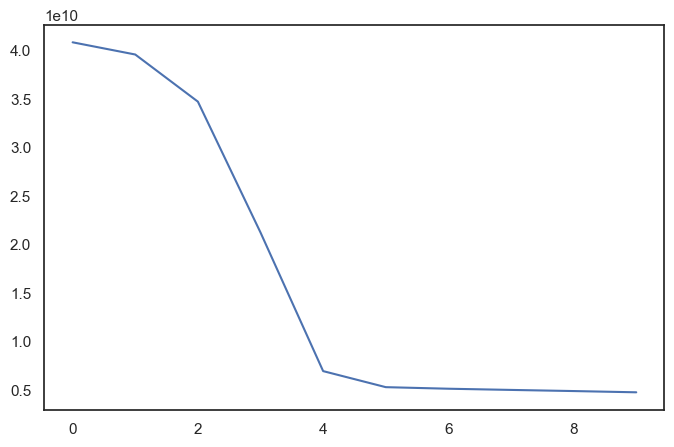

In [152]:
sns.lineplot(x=history.epoch, y=history.history['loss'])

In [153]:
test_pred = [[705, 8765, 2005, 450, 200, 900, 1850, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
             0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 
             0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 
             0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 
             0, 0, 1, 0, 0, 0]]

In [154]:
model.predict(test_pred)

1/1 [==============================] - 0s 63ms/step


array([[178573.36]], dtype=float32)

In [155]:
# Define input layers
num_inputs = 7
num_cat_features = 91
num_classes = 1

num_input_layer = layers.Input(shape=(num_inputs,), name="numeric_inputs")
cat_input_layer = layers.Input(shape=(num_cat_features,), name="categorical_inputs")

# Define hidden layers for numerical input
num_hidden_1 = layers.Dense(64, activation="relu")(num_input_layer)
num_hidden_2 = layers.Dense(32, activation="relu")(num_hidden_1)

# Define hidden layers for categorical input
cat_embedding = layers.Embedding(input_dim=99, output_dim=5)(cat_input_layer)
cat_flatten = layers.Flatten()(cat_embedding)
cat_hidden = layers.Dense(16, activation="relu")(cat_flatten)

# Combine the output of the two paths
combined = layers.concatenate([num_hidden_2, cat_hidden])

# Define output layer
output_layer = layers.Dense(num_classes, activation="softmax")(combined)

# Define the model
model_nn = keras.Model(inputs=[num_input_layer, cat_input_layer], outputs=output_layer)

# Compile the model
model_nn.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.CategoricalCrossentropy(),
    metrics=[keras.metrics.CategoricalAccuracy()],
)

# Print the model summary
model_nn.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 categorical_inputs (InputLayer  [(None, 91)]        0           []                               
 )                                                                                                
                                                                                                  
 numeric_inputs (InputLayer)    [(None, 7)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 91, 5)        495         ['categorical_inputs[0][0]']     
                                                                                                  
 dense_10 (Dense)               (None, 64)           512         ['numeric_inputs[0][0]']     

In [156]:
tf.config.run_functions_eagerly(False)

In [157]:
X_nn_2 = ames_df.drop(['SalePrice'], axis=1)
y_nn_2 = ames_df['SalePrice']

In [158]:
X_train_nn_2, X_test_nn_2, y_train_nn_2, y_test_nn_2 = train_test_split(X_nn_2, y_nn_2, test_size=0.2, random_state=42)

In [159]:
X_train_nn_cat = X_train_nn_2.drop(['Lot Frontage', 'Lot Area', 'Year Built', 
                            'BsmtFin SF 1', 'Bsmt Unf SF', 
                            'Total Bsmt SF', 'Gr Liv Area'], axis=1)
X_train_nn_num = X_train_nn_2[['Lot Frontage', 'Lot Area', 'Year Built', 
                            'BsmtFin SF 1', 'Bsmt Unf SF', 
                            'Total Bsmt SF', 'Gr Liv Area']]

X_test_nn_cat = X_test_nn_2.drop(['Lot Frontage', 'Lot Area', 'Year Built', 
                            'BsmtFin SF 1', 'Bsmt Unf SF', 
                            'Total Bsmt SF', 'Gr Liv Area'], axis=1)
X_test_nn_num = X_test_nn_2[['Lot Frontage', 'Lot Area', 'Year Built', 
                            'BsmtFin SF 1', 'Bsmt Unf SF', 
                            'Total Bsmt SF', 'Gr Liv Area']]

In [160]:
X_train_nn_num.columns.tolist()

['Lot Frontage',
 'Lot Area',
 'Year Built',
 'BsmtFin SF 1',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 'Gr Liv Area']

In [161]:
X_train_nn_num = X_train_nn_num.values
X_train_nn_cat = X_train_nn_cat.values
y_train_nn_2 = y_train_nn_2.values
y_train_nn_2 = y_train_nn_2.reshape(-1,1)

In [162]:
num_inputs_data = np.random.rand(100, num_inputs)  # (batch_size, num_inputs)
cat_inputs_data = np.random.randint(0, 2, size=(100, num_cat_features))  # (batch_size, num_cat_features)

# Generate random output data
output_data = np.random.rand(100, num_classes)  # (batch_size, num_classes)

# Train the model
#model_nn.fit(x=[num_inputs_data, cat_inputs_data], y=output_data, epochs=10, batch_size=32)

In [163]:
model_nn.fit(x=[X_train_nn_num, X_train_nn_cat], y=y_train_nn_2, epochs=10, batch_size=32)

Epoch 1/10


C:\Users\aberg\anaconda3\lib\site-packages\tensorflow\python\util\dispatch.py:1176: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return dispatch_target(*args, **kwargs)


57/57 [==============================] - 0s 883us/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 2/10
57/57 [==============================] - 0s 982us/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 3/10
57/57 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 4/10
57/57 [==============================] - 0s 891us/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 5/10
57/57 [==============================] - 0s 987us/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 6/10
57/57 [==============================] - 0s 945us/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 7/10
57/57 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 8/10
57/57 [==============================] - 0s 946us/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000
Epoch 9/10
57/57 [==============================] - 0s 903us/step - loss: 0.0000e+00 - 

In [164]:
X_test_nn_cat.head()

,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Bldg Type_1Fam,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Fin,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Overall Qual_1,Overall Qual_2,Overall Qual_3,Overall Qual_4,Overall Qual_5,Overall Qual_6,Overall Qual_7,Overall Qual_8,Overall Qual_9,Overall Qual_10,Overall Cond_1,Overall Cond_2,Overall Cond_3,Overall Cond_4,Overall Cond_5,Overall Cond_6,Overall Cond_7,Overall Cond_8,Overall Cond_9,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Central Air_N,Central Air_Y,Full Bath_0,Full Bath_1,Full Bath_2,Full Bath_3,Full Bath_4,Half Bath_0,Half Bath_1,Half Bath_2,Bedroom AbvGr_0,Bedroom AbvGr_1,Bedroom AbvGr_2,Bedroom AbvGr_3,Bedroom AbvGr_4,Bedroom AbvGr_5,Bedroom AbvGr_6,Garage Cars_0.0,Garage Cars_1.0,Garage Cars_2.0,Garage Cars_3.0,Garage Cars_4.0,Garage Cars_5.0
940,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
482,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
581,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
247,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1659,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [165]:
X_test_nn_num = X_test_nn_num.values
X_test_nn_cat = X_test_nn_cat.values
y_test_nn_2 = y_test_nn_2.values
y_test_nn_2 = y_test_nn_2.reshape(-1,1)

In [166]:
y_pred_nn = model_nn.predict([X_test_nn_num, X_test_nn_cat])

15/15 [==============================] - 0s 778us/step


In [167]:
y_pred_labels = np.argmax(y_pred_nn, axis=1)
y_test_labels = np.argmax(y_test_nn_2, axis=1)

In [168]:
accuracy = np.mean(y_pred_labels == y_test_labels)
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 100.00%


In [170]:
joblib.dump(model_nn, 'housing_price_model_nn1.joblib')


['housing_price_model_nn1.joblib']

In [171]:
joblib.dump(model, 'housing_price_model_nn2.joblib')

['housing_price_model_nn2.joblib']